# Octave Introduction

In [2]:
'''Testing imports'''

from qm.QuantumMachinesManager import QuantumMachinesManager
from qm.octave import *
from qm.octave.octave_manager import ClockMode
from qm.qua import *
import os
import time
import matplotlib.pyplot as plt
from qualang_tools.units import unit

In [1]:
"""
octave_introduction.py: shows the basic commands to control the octave's clock, synthesizers, up-converters, triggers,
down-converters and calibration
"""

from qm.QuantumMachinesManager import QuantumMachinesManager
from qm.octave import *
from qm.octave.octave_manager import ClockMode
from qm.qua import *
import os
import time
import matplotlib.pyplot as plt
from qualang_tools.units import unit

# Flags to switch between different modes defined below
check_up_converters = False
check_triggers = False
check_down_converters = False
calibration = False

#################################
# Step 0 : Octave configuration #
#################################
opx_ip = "192.168.88.252"
opx_port = 9510
octave_ip = "192.168.88.254"
octave_port = 80
con = "con1"
octave = "octave1"
# The elements used to test the ports of the Octave
elements = ["qe1", "qe2", "qe3", "qe4", "qe5"]
IF = 50e6  # The IF frequency
LO = 6e9  # The LO frequency <= changed to 3GHz for testing => Rob
minute = 1e3
# The configuration used here
config = {
    "version": 1,
    "controllers": {
        con: {
            "analog_outputs": {
                1: {"offset": 0.0},
                2: {"offset": 0.0},
                3: {"offset": 0.0},
                4: {"offset": 0.0},
                5: {"offset": 0.0},
                6: {"offset": 0.0},
                7: {"offset": 0.0},
                8: {"offset": 0.0},
                9: {"offset": 0.0},
                10: {"offset": 0.0},
            },
            "digital_outputs": {
                1: {},
                2: {},
                3: {},
                4: {},
                5: {},
            },
            "analog_inputs": {
                1: {"offset": +0.0},
                2: {"offset": +0.0},
            },
        }
    },
    "elements": {
        "qe1": {
            "mixInputs": {
                "I": (con, 1),
                "Q": (con, 2),
                "lo_frequency": LO,
                "mixer": f"octave_{octave}_1",  # a fixed name, do not change.
            },
            "intermediate_frequency": IF,
            "operations": {
                "cw": "const",
                "cw_wo_trig": "const_wo_trig",
                "readout": "readout_pulse",
            },
            "digitalInputs": {
                "switch": {
                    "port": (con, 1),
                    "delay": 136,
                    "buffer": 0,
                },
            },
            "outputs": {
                "out1": (con, 1),
                "out2": (con, 2),
            },
            "time_of_flight": 224,#24,
            "smearing": 0,#50,
        },
        "qe2": {
            "mixInputs": {
                "I": (con, 3),
                "Q": (con, 4),
                "lo_frequency": LO,
                "mixer": f"octave_{octave}_2",  # a fixed name, do not change.
            },
            "intermediate_frequency": IF,
            "operations": {
                "cw": "const",
                "cw_wo_trig": "const_wo_trig",
                "readout": "readout_pulse",
            },
            "digitalInputs": {
                "switch": {
                    "port": (con, 2),
                    "delay": 136,
                    "buffer": 0,
                },
            },
            "outputs": {
                "out1": (con, 1),
                "out2": (con, 2),
            },
            "time_of_flight": 24,
            "smearing": 0,
        },
        "qe3": {
            "mixInputs": {
                "I": (con, 5),
                "Q": (con, 6),
                "lo_frequency": LO,
                "mixer": f"octave_{octave}_3",  # a fixed name, do not change.
            },
            "intermediate_frequency": IF,
            "operations": {
                "cw": "const",
                "cw_wo_trig": "const_wo_trig",
            },
            "digitalInputs": {
                "switch": {
                    "port": (con, 3),
                    "delay": 136,
                    "buffer": 0,
                },
            },
        },
        "qe4": {
            "mixInputs": {
                "I": (con, 7),
                "Q": (con, 8),
                "lo_frequency": LO,
                "mixer": f"octave_{octave}_4",  # a fixed name, do not change.
            },
            "intermediate_frequency": IF,
            "operations": {
                "cw": "const",
                "cw_wo_trig": "const_wo_trig",
            },
            "digitalInputs": {
                "switch": {
                    "port": (con, 4),
                    "delay": 136,
                    "buffer": 0,
                },
            },
        },
        "qe5": {
            "mixInputs": {
                "I": (con, 9),
                "Q": (con, 10),
                "lo_frequency": LO,
                "mixer": f"octave_{octave}_5",  # a fixed name, do not change.
            },
            "intermediate_frequency": IF,
            "operations": {
                "cw": "const",
                "cw_wo_trig": "const_wo_trig",
            },
            "digitalInputs": {
                "switch": {
                    "port": (con, 5),
                    "delay": 136,
                    "buffer": 0,
                },
            },
        },
    },
    "pulses": {
        "const": {
            "operation": "control",
            "length": 1000,
            "waveforms": {
                "I": "const_wf",
                "Q": "zero_wf",
            },
            "digital_marker": "ON",
        },
        "const_wo_trig": {
            "operation": "control",
            "length": 1000,
            "waveforms": {
                "I": "const_wf",
                "Q": "zero_wf",
            },
        },
        "readout_pulse": {
            "operation": "measurement",
            "length": 1000, #1000, in nanoseconds 
            "waveforms": {
                "I": "readout_wf",
                "Q": "zero_wf",
            },
            "integration_weights": {
                "cos": "cosine_weights",
                "sin": "sine_weights",
                "minus_sin": "minus_sine_weights",
            },
            "digital_marker": "ON",
        },
    },
    "waveforms": {
        "zero_wf": {
            "type": "constant",
            "sample": 0.0,
        },
        "const_wf": {
            "type": "constant",
            "sample": 0.1,#0.0325,
        },
        "readout_wf": {
            "type": "constant",
            "sample": 0.01, #should correspond to -30 dBm (0.02 Vpp) in part 3
        },
    },
    "digital_waveforms": {
        "ON": {"samples": [(1, 0)]},
        "OFF": {"samples": [(0, 0)]},
    },
    "integration_weights": {
        "cosine_weights": {
            "cosine": [(1.0, 1000)],
            "sine": [(0.0, 1000)],
        },
        "sine_weights": {
            "cosine": [(0.0, 1000)],
            "sine": [(1.0, 1000)],
        },
        "minus_sine_weights": {
            "cosine": [(0.0, 1000)],
            "sine": [(-1.0, 1000)],
        },
    },
    "mixers": {
        f"octave_{octave}_1": [
            {
                "intermediate_frequency": IF,
                "lo_frequency": LO,
                "correction": (1, 0, 0, 1),
            },
        ],
        f"octave_{octave}_2": [
            {
                "intermediate_frequency": IF,
                "lo_frequency": LO,
                "correction": (1, 0, 0, 1),
            },
        ],
        f"octave_{octave}_3": [
            {
                "intermediate_frequency": IF,
                "lo_frequency": LO,
                "correction": (1, 0, 0, 1),
            },
        ],
        f"octave_{octave}_4": [
            {
                "intermediate_frequency": IF,
                "lo_frequency": LO,
                "correction": (1, 0, 0, 1),
            },
        ],
        f"octave_{octave}_5": [
            {
                "intermediate_frequency": IF,
                "lo_frequency": LO,
                "correction": (1, 0, 0, 1),
            },
        ],
    },
}

# Create the octave config object
octave_config = QmOctaveConfig()
# Specify where to store the outcome of the calibration (correction matrix, offsets...)
octave_config.set_calibration_db(os.getcwd())
# Add an Octave called 'octave1' with the specified IP and port
octave_config.add_device_info(octave, octave_ip, octave_port)
# Define the connectivity between our Octave to the OPX(s) ports. The 'default'
# connectivity is as follows:
#    +- OCTAVE (octave1) --------------------------------------------------------+
#    |                                      I1    I2    I3    I4    I5           |
#    |             o    o    o    o    o     o<+   o<+   o<+   o<+   o<+     o   |
#    |   o    o                           QM   |     |     |     |     |         |
#    |             o    o    o    o    o   +>o | +>o | +>o | +>o | +>o |     o   |
#    |                                     |Q1 | |Q2 | |Q3 | |Q4 | |Q5 |         |
#    +-------------------------------------|---|-|---|-|---|-|---|-|---|---------+
#                                          |   | |   | |   | |   | |   |
#                                          |   | |   | |   | |   | |   |
#    +- OPX (con1) ------------------------|---|-|---|-|---|-|---|-|---|---------+
#    |                                     | 1 | | 3 | | 5 | | 7 | | 9 |         |
#    |     o     o     o     o     o    |  | o<+ | o<+ | o<+ | o<+ | o<+ |   o   |
#    |                                     |     |     |     |     |             |
#    |     o     o     o     o     o    |  +>o   +>o   +>o   +>o   +>o   |   o   |
#    |                                       2     4     6     8    10           |
#    +---------------------------------------------------------------------------+
octave_config.set_opx_octave_mapping([(con, octave)])
# The last command is equivalent to
# octave_config.add_opx_octave_port_mapping({
#     ('con1',  1) : ('octave1', 'I1'),
#     ('con1',  2) : ('octave1', 'Q1'),
#     ('con1',  3) : ('octave1', 'I2'),
#     ('con1',  4) : ('octave1', 'Q2'),
#     ('con1',  5) : ('octave1', 'I3'),
#     ('con1',  6) : ('octave1', 'Q3'),
#     ('con1',  7) : ('octave1', 'I4'),
#     ('con1',  8) : ('octave1', 'Q4'),
#     ('con1',  9) : ('octave1', 'I5'),
#     ('con1', 10) : ('octave1', 'Q5'),
# })

# Open the QuantumMachineManager for the OPX and Octave
qmm = QuantumMachinesManager(host=opx_ip, port=opx_port, octave=octave_config)
# Open a quantum machine to calibrate the ports or play signals
qm = qmm.open_qm(config)

# Messing with the elements list for understanding the waveforms => ROB
elements = ["qe1", "qe2", "qe3", "qe4", "qe5"]
#elements = ["qe1","qe2"]

# Simple test program that plays a continuous wave through all ports
with program() as hello_octave:
    with infinite_loop_():
        for el in elements:
            play("cw", el)

2023-12-19 18:37:19,477 - qm - INFO     - Starting session: 282695b1-7c53-4afd-91eb-b5242e5caeeb


C:\Users\measPC\AppData\Local\Temp\ipykernel_8760\1892444232.py:6: DeprecationWarning: 'qm.QuantumMachinesManager.QuantumMachinesManager' is moved as of 1.1.2 and will be removed in 1.2.0. use 'qm.QuantumMachinesManager' instead
  from qm.QuantumMachinesManager import QuantumMachinesManager
C:\Users\measPC\AppData\Local\Temp\ipykernel_8760\1892444232.py:309: DeprecationWarning: OctaveConfig.set_opx_octave_mapping is deprecated as of 1.1.0 and will be removed in 1.2.0, The port mapping was moved to the config. Please set the mapping there
  octave_config.set_opx_octave_mapping([(con, octave)])


2023-12-19 18:37:22,045 - qm - INFO     - Octave "octave1" Health check passed, current temperature 57
2023-12-19 18:37:22,049 - qm - INFO     - Performing health check
2023-12-19 18:37:22,059 - qm - INFO     - Health check passed


QMTimeoutError: Timeout reached while running 'open_qm'

In [2]:

###########################
# Step 1 : clock settings #
###########################
external_clock = False
if external_clock:
    # Change to the relevant external frequency
    qm.octave.set_clock(octave, clock_mode=ClockMode.External_10MHz)
else:
    qm.octave.set_clock(octave, clock_mode=ClockMode.Internal)
# You can connect clock out from rear panel to a spectrum analyzer  to see the 1GHz signal

#########################################
# Step 2 : set LO, RF gain, and RF mode #
#########################################
external_LO = False
# For external LO only:
if external_LO:
    # OctaveLOSource.LO1,2,3,4,5 to use an external LO source connected to the corresponding ports in the rear panel.
    qm.octave.set_lo_source(elements[1], OctaveLOSource.LO2)
    qm.octave.set_rf_output_gain(elements[1], 0)  # can set the gain from -10dB to 20dB
    qm.octave.set_rf_output_mode(elements[1], RFOutputMode.on)  # set the behaviour of the RF switch to be 'on'.
# For internal LO only:
else:
    for el in elements:
        qm.octave.set_lo_source(el, OctaveLOSource.Internal)  # Use the internal synthetizer to generate the LO.
        qm.octave.set_lo_frequency(el, LO)  # assign the LO inside the octave to element
        qm.octave.set_rf_output_gain(el, 0)  # can set the gain from -10dB to 20dB
        qm.octave.set_rf_output_mode(el, RFOutputMode.on)  # set the behaviour of the RF switch to be 'on'.
        # 'RFOutputMode' can be : on, off, trig_normal or trig_inverse
        # You can check the internal LOs by connecting the ports synth1, 2 and 3 to a spectrum analyzer.

#######################################
# Step 3 : checking the up-converters #
#######################################
if check_up_converters:
    print("-" * 37 + " Checking up-converters")
    job = qm.execute(hello_octave)
    time.sleep(60)  # The program will run for 1 minute
    job.halt()
    # You can connect RF1, RF2, RF3, RF4, RF5 to a spectrum analyzer and check the 3 peaks before calibration:
    # 1. LO-IF, 2. LO, 3. LO+IF

C:\Users\measPC\AppData\Local\Temp\ipykernel_7988\11242326.py:9: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_clock(octave, clock_mode=ClockMode.Internal)
C:\Users\measPC\AppData\Local\Temp\ipykernel_7988\11242326.py:25: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_source(el, OctaveLOSource.Internal)  # Use the internal synthetizer to generate the LO.
C:\Users\measPC\AppData\Local\Temp\ipykernel_7988\11242326.py:26: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(el, LO)  # assign the LO inside the octave to element
C:\Users\measPC\AppData\Local\Temp\i

In [250]:
# Cell split so we could run only the trigger check

check_triggers = False
##################################
# Step 4 : checking the triggers #
##################################
if check_triggers:
    print("-" * 37 + " Checking triggers")
    # Connect RF1, RF2, RF3, RF4, RF5 to a spectrum analyzer and check that you get a signal for 4sec then don't get a signal fo 4 sec and so on.
    for el in elements:
        # set the behaviour of the RF switch to be on only when triggered
        qm.octave.set_rf_output_mode(el, RFOutputMode.trig_normal)
    with program() as hello_octave_trigger:
        with infinite_loop_():
            for el in elements:
                play("cw", el, duration=1e9)
                play("cw_wo_trig", el, duration=1e9)
    job = qm.execute(hello_octave_trigger)
    time.sleep(60)  #  The program will run for 1 minute
    job.halt()

# Downconversion primer

In [251]:
import matplotlib.pyplot as plt
%matplotlib notebook

In [281]:

''' Find Max Avg peaks finds the average maximum value of an oscillating wave given a frequency value. FindMinAvgPeaks does the same for the average minimum value'''
def findMaxAvgPeaks(adcStream, freq):
    period = 1/(freq)
    #print(period)
    peaks = []
    i = 0
    
    points = []
    for point in adcStream:
        points.append(point)
        if(i % (int)(period) == 0 and i != 0):
            peaks.append(np.max(points))
            points = []
        i += 1
    return np.mean(peaks)
def findMinAvgPeaks(adcStream, freq):
    period = 1/(freq)
    peaks = []
    i = 0
    points = []
    for point in adcStream:
        points.append(point)
        if(i % (int)(period) == 0 and i != 0):
            peaks.append(np.min(points))
            points = []
        i += 1
    return np.mean(peaks)

------------------------------------- Checking down-converters


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2406432314.py:20: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], -7)
C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2406432314.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_qua_element_octave_rf_in_port(elements[0], octave, 1)
C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2406432314.py:24: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_downconversion(


2023-11-15 17:51:22,842 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:51:22,907 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


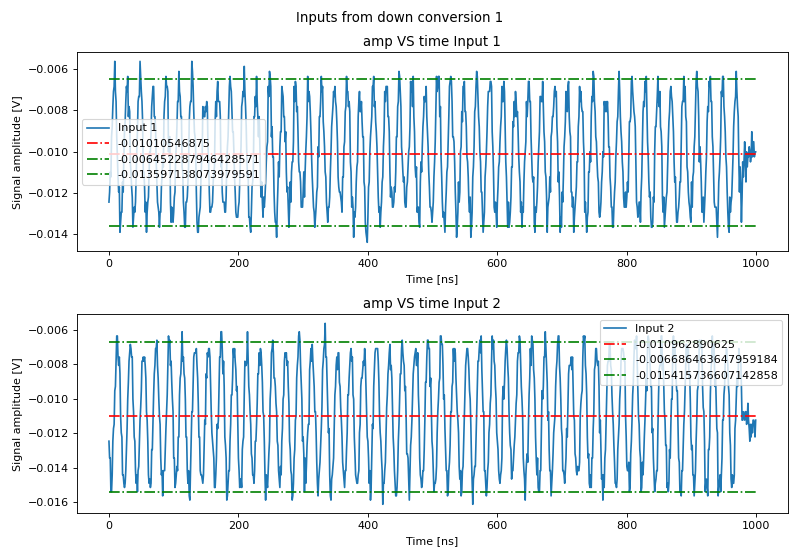

In [429]:
import matplotlib.pyplot as plt
# Cell split so we could run only the check_triggers
calibration = False #remmeber to comment out -Taha
check_down_converters = True # THIS HAS BEEN CHANGED TO TRUE FROM ORIGINAL VALUE - ROB
#########################################
# Step 5 : checking the down-converters #
#########################################
if check_down_converters:
    print("-" * 37 + " Checking down-converters")
    # Connect RF1 -> RF1In, RF2 -> RF2In
    # Connect IFOUT1 -> AI1 , IFOUT2 -> AI2
    check_down_converter_1 = True
    check_down_converter_2 = False
    u = unit()
    if check_down_converter_1:
        # Reduce the Octave gain to avoid saturating the OPX ADC
        qm.octave.set_rf_output_gain(elements[0], -10)
        # Set the Octave down-conversion port to be RF1In1 for the first element "qe1"
        qm.octave.set_qua_element_octave_rf_in_port(elements[0], octave, 1)
        # Set the source of the down-conversion LO to be internal (only for RF1In1)
        qm.octave.set_downconversion(
            elements[0], lo_source=RFInputLOSource.Internal, if_mode_i=IFMode.direct, if_mode_q=IFMode.direct
        )
        with program() as hello_octave_readout_1:
            raw_ADC_1 = declare_stream(adc_trace=True)
            measure("readout", elements[0], raw_ADC_1)
            with stream_processing():
                raw_ADC_1.input1().save("adc_1")
                raw_ADC_1.input2().save("adc_2")
        # Execute the program
        job = qm.execute(hello_octave_readout_1)
        res = job.result_handles
        res.wait_for_all_values()
        # Plot the results
        fig, (ax1, ax2) = plt.subplots(2,1, figsize=(10,7))
        fig.suptitle("Inputs from down conversion 1")
        adc_1 = u.raw2volts(res.get("adc_1").fetch_all())
        
        
        ax1.plot(adc_1, label="Input 1")
        ax1.plot(np.ones(len(adc_1))*np.mean(adc_1), '-.', color = "red", label = np.mean(adc_1)) #-Taha addition to see the mean 
        ax1.plot(np.ones(len(adc_1))*findMaxAvgPeaks(adc_1, .05), '-.', color = "green", label = findMaxAvgPeaks(adc_1, .05)) #-Taha addition to see the mean 
        ax1.plot(np.ones(len(adc_1))*findMinAvgPeaks(adc_1, .05), '-.', color = "green", label = findMinAvgPeaks(adc_1, .05)) #-Taha addition to see the mean 

        ax1.set_title("amp VS time Input 1")
        ax1.set_xlabel("Time [ns]")
        ax1.set_ylabel("Signal amplitude [V]")
        ax1.legend() #-Taha addition
        
        adc_2 = u.raw2volts(res.get("adc_2").fetch_all())
        
        ax2.plot(adc_2, label="Input 2")
        ax2.plot(np.ones(len(adc_2))*np.mean(adc_2), '-.', color = "red", label = np.mean(adc_2)) #-Taha addition to see the mean 
        ax2.plot(np.ones(len(adc_2))*findMaxAvgPeaks(adc_2, .05), '-.', color = "green", label = findMaxAvgPeaks(adc_2, .05)) #-Taha addition to see the mean 
        ax2.plot(np.ones(len(adc_2))*findMinAvgPeaks(adc_2, .05), '-.', color = "green", label = findMinAvgPeaks(adc_2, .05)) #-Taha addition to see the mean
        
        ax2.set_title("amp VS time Input 2")
        ax2.set_xlabel("Time [ns]")
        ax2.set_ylabel("Signal amplitude [V]")
        ax2.legend() #-Taha addition
        plt.tight_layout()
        
    if check_down_converter_2:
        # Reduce the Octave gain to avoid saturating the OPX ADC
        qm.octave.set_rf_output_gain(elements[1], 0) 
        # Set the Octave down-conversion port to be RF1In2 for the second element "qe2"
        qm.octave.set_qua_element_octave_rf_in_port(elements[1], octave, 2)
        # Set the source of the down-conversion LO to be external from the port Dmd2LO in the rear panel
        qm.octave.set_downconversion(
            elements[1], lo_source=RFInputLOSource.Dmd2LO, if_mode_i=IFMode.direct, if_mode_q=IFMode.direct
        )
        with program() as hello_octave_readout_2:
            raw_ADC_2 = declare_stream(adc_trace=True)
            measure("readout", elements[1], raw_ADC_2)
            with stream_processing():
                raw_ADC_2.input1().save("adc_1")
                raw_ADC_2.input2().save("adc_2")
        # Execute the program
        job = qm.execute(hello_octave_readout_2)
        res = job.result_handles
        res.wait_for_all_values()
        # Plot the results
        fig, (ax1, ax2) = plt.subplots(2,1, figsize=(10,5))
        fig.suptitle("Inputs from down conversion 2")
        adc_1 = u.raw2volts(res.get("adc_1").fetch_all())
        ax1.plot(adc_1, label="Input 1")
        ax1.set_title("amp VS time Input 1")
        ax1.set_xlabel("Time [ns]")
        ax1.set_ylabel("Signal amplitude [V]")

        adc_2 = u.raw2volts(res.get("adc_2").fetch_all())
        ax2.plot(adc_2, label="Input 2")
        ax2.set_title("amp VS time Input 2")
        ax2.set_xlabel("Time [ns]")
        ax2.set_ylabel("Signal amplitude [V]")
        plt.tight_layout()

#################################
# Step 6 : checking calibration #
#################################
if calibration:
    print("-" * 37 + " Play before calibration")
    # Step 5.1: Connect RF1 and run these lines in order to see the uncalibrated signal first
    job = qm.execute(hello_octave)
    time.sleep(10)  # The program will run for 10 seconds
    job.halt()
    # Step 5.2: Run this in order to calibrate
    for i in range(len(elements)):
        print("-" * 37 + f" Calibrates {elements[i]}")
        qm.octave.calibrate_element(elements[i], [(LO, IF)])  # can provide many pairs of LO & IFs.
        qm = qmm.open_qm(config)
    # Step 5.3: Run these and look at the spectrum analyzer and check if you get 1 peak at LO+IF (i.e. 6.05GHz)
    print("-" * 37 + " Play after calibration")
    job = qm.execute(hello_octave)
    time.sleep(30)  # The program will run for 30 seconds
    job.halt()

# Calibration step, only run if calibrating #

In [236]:


# Step 5.1: Connect RF1 and run these lines in order to see the uncalibrated signal first
job = qm.execute(hello_octave)
time.sleep(10)  # The program will run for 10 seconds
job.halt()

C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\809990900.py:3: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_mode(el, RFOutputMode.on)
C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\809990900.py:3: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_mode(el, RFOutputMode.on)


2023-11-15 14:43:12,004 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 14:43:12,071 - qm - INFO     - Executing program


True

In [447]:
for i in range(len(elements)):
    print("-" * 37 + f" Calibrates {elements[i]}")
    qm.octave.calibrate_element(elements[i], [(LO, IF)])  # can provide many pairs of LO & IFs.
    qm = qmm.open_qm(config)

------------------------------------- Calibrates qe1


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2021960351.py:3: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.calibrate_element(elements[i], [(LO, IF)])  # can provide many pairs of LO & IFs.
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:327: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_conf

2023-11-16 12:13:06,385 - qm - INFO     - Compiling program


d:\anaconda3\lib\site-packages\qm\octave\octave_manager.py:561: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  with qm.octave.batch_mode():
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to t

------------------------------------- Calibrates qe2


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2021960351.py:3: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.calibrate_element(elements[i], [(LO, IF)])  # can provide many pairs of LO & IFs.
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:327: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_conf

2023-11-16 12:13:18,453 - qm - INFO     - Compiling program


d:\anaconda3\lib\site-packages\qm\octave\octave_manager.py:561: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  with qm.octave.batch_mode():
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to t

------------------------------------- Calibrates qe3


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2021960351.py:3: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.calibrate_element(elements[i], [(LO, IF)])  # can provide many pairs of LO & IFs.
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:327: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_conf

2023-11-16 12:13:31,320 - qm - INFO     - Compiling program


d:\anaconda3\lib\site-packages\qm\octave\octave_manager.py:561: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  with qm.octave.batch_mode():
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to t

------------------------------------- Calibrates qe4


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2021960351.py:3: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.calibrate_element(elements[i], [(LO, IF)])  # can provide many pairs of LO & IFs.
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:327: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_conf

2023-11-16 12:13:43,449 - qm - INFO     - Compiling program


d:\anaconda3\lib\site-packages\qm\octave\octave_manager.py:561: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  with qm.octave.batch_mode():
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to t

------------------------------------- Calibrates qe5


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2021960351.py:3: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.calibrate_element(elements[i], [(LO, IF)])  # can provide many pairs of LO & IFs.
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:327: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_conf

2023-11-16 12:13:56,539 - qm - INFO     - Compiling program


d:\anaconda3\lib\site-packages\qm\octave\octave_manager.py:561: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  with qm.octave.batch_mode():
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to the config, please move your mapping there
  conns = self.get_opx_octave_port_mapping()
d:\anaconda3\lib\site-packages\qm\octave\octave_config.py:342: DeprecationWarning: Setting port mapping was moved to t

In [448]:
#Play after calibration and should see only 1 band in FFT
qm.octave.set_rf_output_gain(elements[0], 0)

print("-" * 37 + " Play after calibration")
job = qm.execute(hello_octave)
time.sleep(30)  # The program will run for 30 seconds
job.halt()

C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3764272587.py:1: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], 0)


------------------------------------- Play after calibration
2023-11-16 12:14:15,761 - qm - INFO     - Sending program to QOP for compilation
2023-11-16 12:14:15,837 - qm - INFO     - Executing program


True

# Checking Frequency dependence of Signal Amplitude ###

## Check that the rf_gain and rf_freq functions work

In [452]:
qm.octave.set_rf_output_mode(elements[0], RFOutputMode.off)

C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\4220294852.py:1: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_mode(elements[0], RFOutputMode.off)


In [460]:
#Play hello_octave for different gains in rf_output_gain at 6 GHz. Note that this was changed to just be gain;
#you must make sure given the initial voltage for I in the configuration file that the gain you put in does not saturate
#the octave Rfin ports; note that the octave limits are: [-40 dBm, -20 dBm]

Gain = -20#dB
LO = 6e9

for el in elements:
    qm.octave.set_lo_source(el, OctaveLOSource.Internal)  # Use the internal synthetizer to generate the LO.
    qm.octave.set_lo_frequency(el, LO)  # assign the LO inside the octave to element
    qm.octave.set_rf_output_gain(el, Gain)  # can set the gain from -10dB to 20dB
    qm.octave.set_rf_output_mode(el, RFOutputMode.on)  # set the behaviour of the RF switch to be 'on'.
    # 'RFOutputMode' can be : on, off, trig_normal or trig_inverse
    # You can check the internal LOs by connecting the ports synth1, 2 and 3 to a spectrum analyzer.

#######################################
# Step 3 : checking the up-converters #
#######################################

print("-" * 37 + " Checking up-converters")
job = qm.execute(hello_octave)
time.sleep(10)  # The program will run for 1 minute
job.halt()
# You can connect RF1, RF2, RF3, RF4, RF5 to a spectrum analyzer and check the 3 peaks before calibration:
# 1. LO-IF, 2. LO, 3. LO+IF


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\1529444413.py:7: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_source(el, OctaveLOSource.Internal)  # Use the internal synthetizer to generate the LO.
C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\1529444413.py:8: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(el, LO)  # assign the LO inside the octave to element
C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\1529444413.py:9: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(el, trueGain+10)  # can set the gain from -10dB to 20dB
C:\Use

------------------------------------- Checking up-converters
2023-11-16 12:24:30,750 - qm - INFO     - Sending program to QOP for compilation
2023-11-16 12:24:30,837 - qm - INFO     - Executing program


True

## Checks input voltage and signal amplitude dependence with a fixed LO frequency #

sine function fit

In [462]:
"""
A sine wave fit that takes y values yy and x values tt. Note that it returns a dictionary of the form:
 {"amp": A, "omega": w, "phase": p, "offset": c, "freq": f, "period": 1./f, "fitfunc": fitfunc, "maxcov": numpy.max(pcov), "rawres": (guess,popt,pcov)}
 where amp is amplitude, w angular frequency, p phase, c DC offset, f frequency, 1/f period, a fitfunction which is the sine function that the parameters give, 
 maxcov covariance, and results which is a list that gives you the fit values you can plot
"""

import numpy, scipy.optimize

def fit_sin(tt, yy):
    '''Fit sin to the input time sequence, and return fitting parameters "amp", "omega", "phase", "offset", "freq", "period" and "fitfunc"'''
    tt = numpy.array(tt)
    yy = numpy.array(yy)
    ff = numpy.fft.fftfreq(len(tt), (tt[1]-tt[0]))   # assume uniform spacing
    Fyy = abs(numpy.fft.fft(yy))
    guess_freq = abs(ff[numpy.argmax(Fyy[1:])+1])   # excluding the zero frequency "peak", which is related to offset
    guess_amp = numpy.std(yy) * 2.**0.5
    guess_offset = numpy.mean(yy)
    guess = numpy.array([guess_amp, 2.*numpy.pi*guess_freq, 0., guess_offset])

    def sinfunc(t, A, w, p, c):  return A * numpy.sin(w*t + p) + c
    popt, pcov = scipy.optimize.curve_fit(sinfunc, tt, yy, p0=guess)
    A, w, p, c = popt
    f = w/(2.*numpy.pi)
    fitfunc = lambda t: A * numpy.sin(w*t + p) + c
    return {"amp": A, "omega": w, "phase": p, "offset": c, "freq": f, "period": 1./f, "fitfunc": fitfunc, "maxcov": numpy.max(pcov), "rawres": (guess,popt,pcov)}

In [472]:
#qm.octave.set_lo_frequency(el, LO)

"""Defines a readout qua function that sends a readout pulse from I"""

with program() as hello_octave_readout_1:
    raw_ADC_1 = declare_stream(adc_trace=True)
    measure("readout", elements[0], raw_ADC_1)
    with stream_processing():
        raw_ADC_1.input1().save("adc_1")
        raw_ADC_1.input2().save("adc_2")

"""Function that gives amplitude given max/min bounds and an average value"""
def amplitude(maximum, minimum, middle):
    return (np.absolute(maximum-middle)+np.absolute(minimum - middle) + np.absolute(maximum+minimum)/2)/3

"""
Assuming that our readout wave wave at I is output at -30 dBm (if it is not, set it to be so in config file),
we take a start and end value at the RF1 output and do the hello_octave_readout_1 program for start --> end 
at step intervals. For each RF1 output value, we plot the resulting signal amplitude recorded by the OPX.

This is done assuming RF1 --> RF1in and IFout --> Analog inputs. We record values and report the following for each 
output data point: 

 vals = {
        "input 1": {"signal amplitude" : [], "initial voltage": [], "freqs" : [], "phase" : [], "offset": [], "covariances": []},
        "input 2": {"signal amplitude" : [], "initial voltage": [], "freqs" : [], "phase" : [], "offset": [], "covariances": []}   
           }

"""

def voltCheck(start, stop, step, LO = 3e9):
    def toVolts(dBm, impedance = 50):
        impFactor = np.sqrt(impedance/1000)
        powerFactor = 10**(dBm/20)
        return impFactor*powerFactor
    
    phases = []
    print(f"LO Frequency at {LO}")
    qm.octave.set_lo_frequency(elements[0], LO)
    vals = {
        "input 1": {"signal amplitude" : [], "initial voltage": [], "freqs" : [], "phase" : [], "offset": [], "covariances": []},
        "input 2": {"signal amplitude" : [], "initial voltage": [], "freqs" : [], "phase" : [], "offset": [], "covariances": []}   
           }
    for i in range(start, stop, step):
        qm.octave.set_rf_output_gain(elements[0], i)
        ieff = i-30
        
        job = qm.execute(hello_octave_readout_1)
        res = job.result_handles
        res.wait_for_all_values()
        
        fig, (ax1, ax2) = plt.subplots(2,1, figsize=(10,7))
        fig.suptitle(f"Inputs from down conversion 1, gain = {ieff} dBm")
        adc_1 = u.raw2volts(res.get("adc_1").fetch_all())
        
        t = np.linspace(1, len(adc_1), len(adc_1))
        sine = fit_sin(t, adc_1)
        
        ax1.plot(sine["fitfunc"](t), "-.", label="y fit curve", linewidth=2, color = "orange")
        print( "Amplitude=%(amp)s, Angular freq.=%(omega)s, phase=%(phase)s, offset=%(offset)s, Max. Cov.=%(maxcov)s" % sine )
        
        vals["input 1"]["signal amplitude"].append(np.absolute(sine["amp"]))
        vals["input 1"]["initial voltage"].append(toVolts(ieff))
        vals["input 1"]["freqs"].append(sine["omega"])
        vals["input 1"]["phase"].append(sine["phase"])
        vals["input 1"]["offset"].append(sine["offset"])
        vals["input 1"]["covariances"].append(sine["maxcov"])
        
        phase1 = sine["omega"]
        
        ax1.scatter(t, adc_1, label="Input 1", s = 5)
        ax1.plot(np.ones(len(adc_1))*np.mean(adc_1), '-.', color = "red", label = np.mean(adc_1)) #-Taha addition to see the mean 
        ax1.plot(np.ones(len(adc_1))*findMaxAvgPeaks(adc_1, .05), '-.', color = "green", label = findMaxAvgPeaks(adc_1, .05)) #-Taha addition to see the mean 
        ax1.plot(np.ones(len(adc_1))*findMinAvgPeaks(adc_1, .05), '-.', color = "green", label = findMinAvgPeaks(adc_1, .05)) #-Taha addition to see the mean 
        
        
        
        ax1.set_title("amp VS time Input 1")
        ax1.set_xlabel("Time [ns]")
        ax1.set_ylabel("Signal amplitude [V]")
        ax1.legend() #-Taha addition
        
        adc_2 = u.raw2volts(res.get("adc_2").fetch_all())
        
        sine = fit_sin(t, adc_2)
        
        ax2.plot(sine["fitfunc"](t), "-.", label="y fit curve", linewidth=2, color = "orange")
        print( "Amplitude=%(amp)s, Angular freq.=%(omega)s, phase=%(phase)s, offset=%(offset)s, Max. Cov.=%(maxcov)s" % sine )
        
        
        
        
        
        ax2.scatter(t, adc_2, label="Input 2", s = 5)
        ax2.plot(np.ones(len(adc_2))*np.mean(adc_2), '-.', color = "red", label = np.mean(adc_2)) #-Taha addition to see the mean 
        ax2.plot(np.ones(len(adc_2))*findMaxAvgPeaks(adc_2, .05), '-.', color = "green", label = findMaxAvgPeaks(adc_2, .05)) #-Taha addition to see the mean 
        ax2.plot(np.ones(len(adc_2))*findMinAvgPeaks(adc_2, .05), '-.', color = "green", label = findMinAvgPeaks(adc_2, .05)) #-Taha addition to see the mean
        
        ax2.set_title("amp VS time Input 2")
        ax2.set_xlabel("Time [ns]")
        ax2.set_ylabel("Signal amplitude [V]")
        ax2.legend() #-Taha addition
        plt.tight_layout()
        
        vals["input 2"]["signal amplitude"].append(np.absolute(sine["amp"]))
        vals["input 2"]["initial voltage"].append(toVolts(ieff))
        vals["input 2"]["freqs"].append(sine["omega"])
        vals["input 2"]["phase"].append(sine["phase"])
        vals["input 2"]["offset"].append(sine["offset"])
        vals["input 2"]["covariances"].append(sine["maxcov"])
        
        phase2 = sine["omega"]
        
        phases.append(np.absolute(phase1-phase2))
    
    
    print(f"phase offset is {np.mean(np.array(phases))}")
    
    return vals


        
        

LO Frequency at 9000000000.0


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:21: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], LO)


2023-11-16 13:19:10,031 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:10,082 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


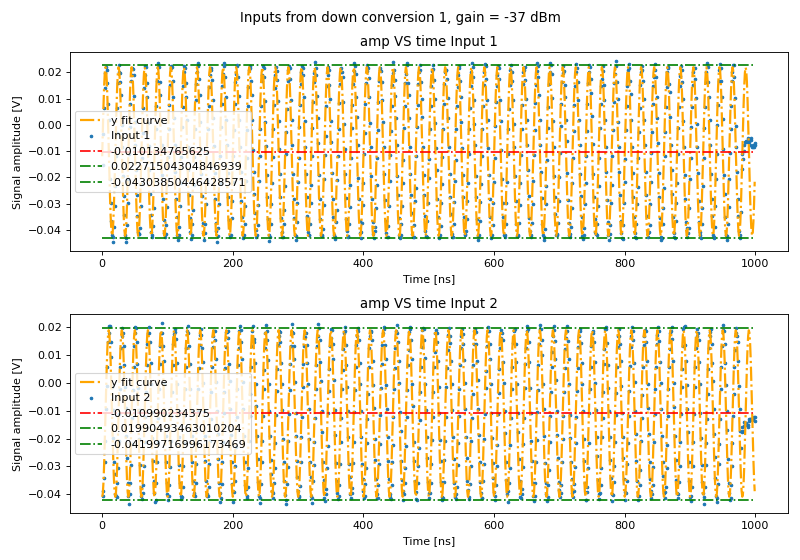

Amplitude=0.03209479942560373, Angular freq.=0.3141630134329669, phase=-0.37036201533695795, offset=-0.010134684949332418, Max. Cov.=8.862125044481898e-05
Amplitude=0.029997131842894445, Angular freq.=0.31413045116897587, phase=-1.9105506593277644, offset=-0.010992943678238522, Max. Cov.=9.547891515833644e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:10,798 - qm - INFO     - Sending program to QOP for compilation
2023-11-16 13:19:10,866 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


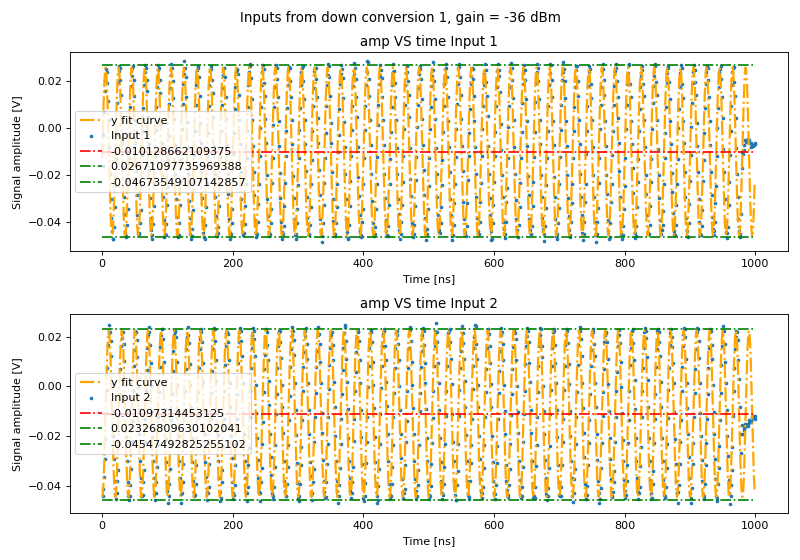

Amplitude=0.03585534776783196, Angular freq.=0.3141774556408381, phase=-0.3864865341230588, offset=-0.010128206593442123, Max. Cov.=8.657004524636916e-05
Amplitude=0.03346741287786715, Angular freq.=0.31414109701271037, phase=-1.927470356014429, offset=-0.010975045907933498, Max. Cov.=9.451090295839206e-05
2023-11-16 13:19:11,494 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:11,562 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


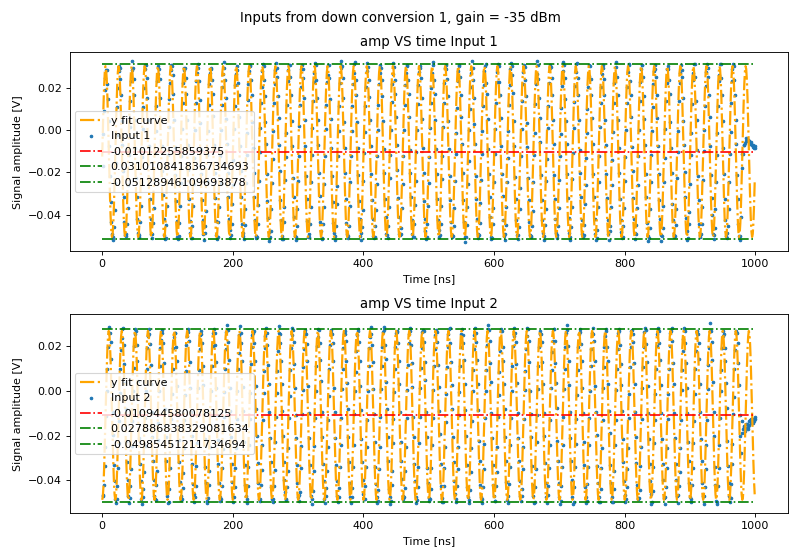

Amplitude=0.04036260715080085, Angular freq.=0.3141646818685636, phase=-0.37290161985176623, offset=-0.010122410804875422, Max. Cov.=8.503821424111482e-05
Amplitude=0.037843347602709014, Angular freq.=0.31414563370806475, phase=-1.92253756374371, offset=-0.010946195610323752, Max. Cov.=9.561018757201147e-05
2023-11-16 13:19:12,164 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:12,226 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


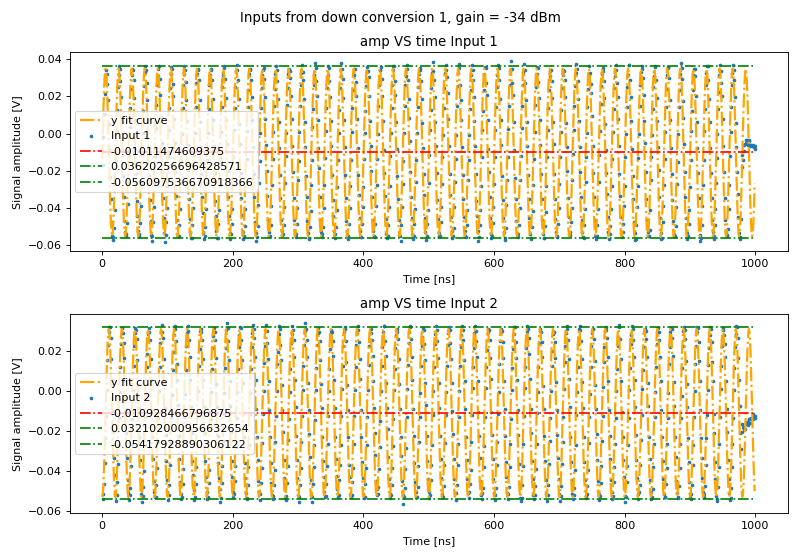

Amplitude=0.045067224018741164, Angular freq.=0.31416156489427055, phase=-0.3835485218660535, offset=-0.010114672090158209, Max. Cov.=8.622936882959773e-05
Amplitude=0.04206188340795158, Angular freq.=0.3141476298383173, phase=-1.9338609586817859, offset=-0.010929996160821222, Max. Cov.=9.327253424920345e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:13,031 - qm - INFO     - Sending program to QOP for compilation
2023-11-16 13:19:13,095 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


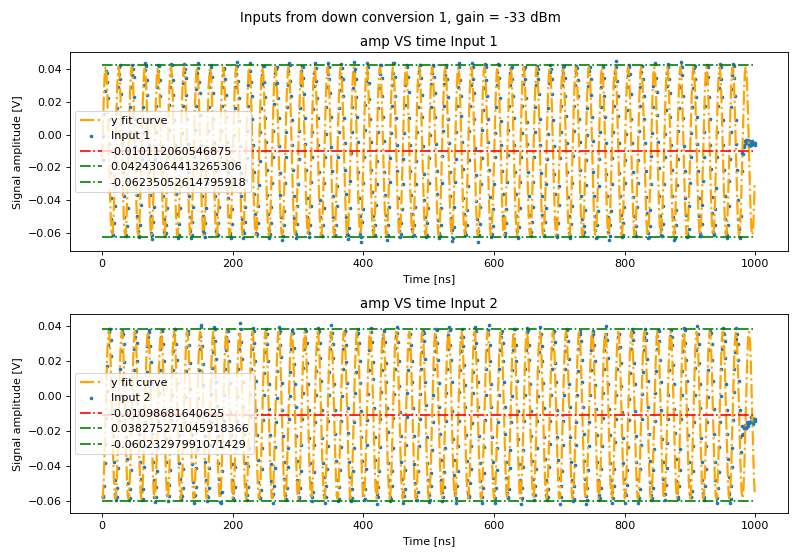

Amplitude=0.051059052374386356, Angular freq.=0.3141610221861611, phase=-0.39418196411643314, offset=-0.010111993448267473, Max. Cov.=8.827194010550623e-05
Amplitude=0.0477948606415702, Angular freq.=0.31413614189614053, phase=-1.9419763793067615, offset=-0.010990259426300152, Max. Cov.=9.17596961059642e-05
2023-11-16 13:19:13,692 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:13,741 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


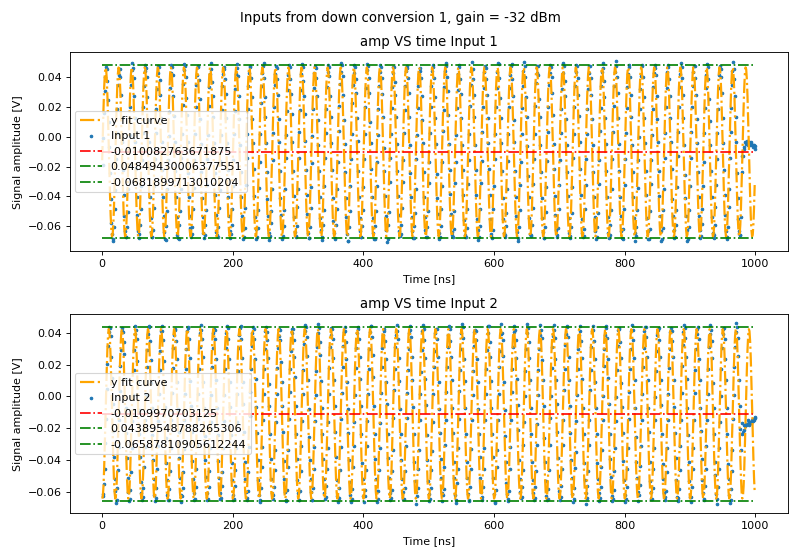

Amplitude=0.05700243878092986, Angular freq.=0.3141708915587268, phase=-0.41232948186445784, offset=-0.010082240806688165, Max. Cov.=8.644759165822378e-05
Amplitude=0.053415009840042715, Angular freq.=0.3141453336075119, phase=-1.9583128139706947, offset=-0.010999382201047394, Max. Cov.=9.297249041207201e-05
2023-11-16 13:19:15,070 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:15,128 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


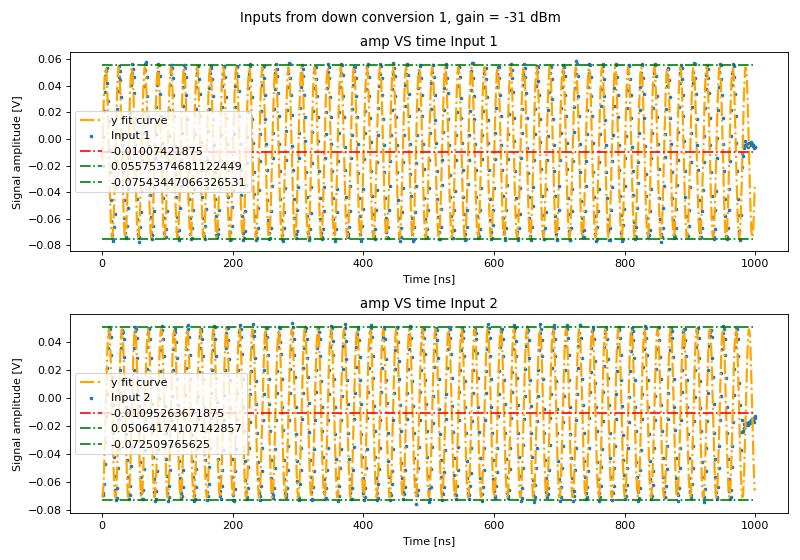

Amplitude=0.06416723294161236, Angular freq.=0.3141667339995455, phase=-0.4135752403245066, offset=-0.010073835703773813, Max. Cov.=8.889238050252623e-05
Amplitude=0.06018108599377165, Angular freq.=0.31414775583739124, phase=-1.9670861875538588, offset=-0.010954784559255778, Max. Cov.=9.42097700085381e-05
2023-11-16 13:19:15,755 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:15,820 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


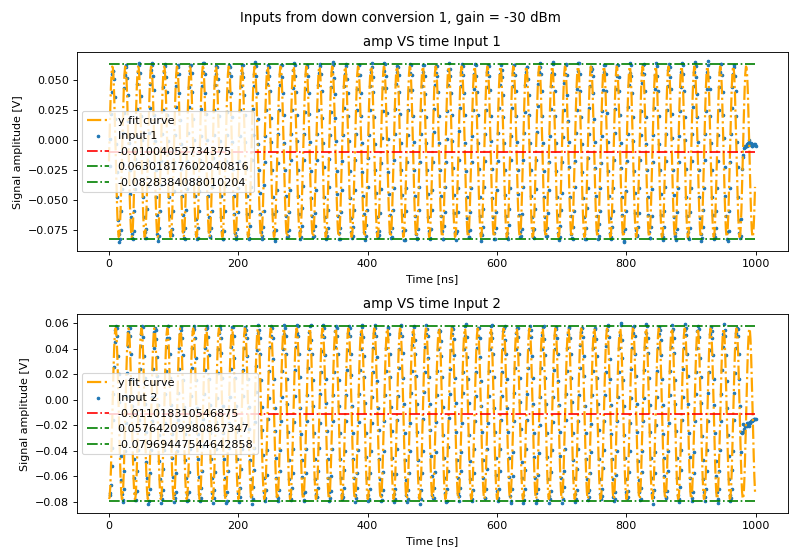

Amplitude=0.07159893911600328, Angular freq.=0.3141641644010107, phase=-0.4270119595057921, offset=-0.010040231028270804, Max. Cov.=8.878243969652995e-05
Amplitude=0.06718030913595917, Angular freq.=0.31414106910122785, phase=-1.9784390813926716, offset=-0.011022086890540312, Max. Cov.=9.235781540710723e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:16,542 - qm - INFO     - Sending program to QOP for compilation
2023-11-16 13:19:16,592 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


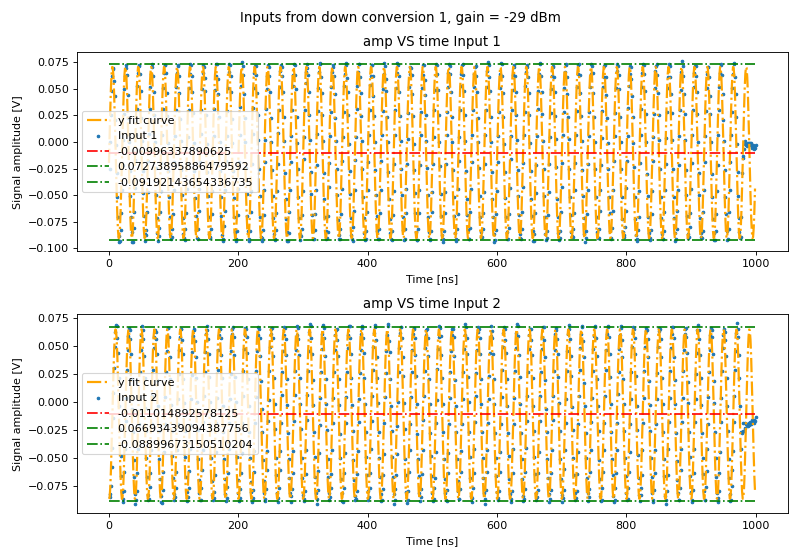

Amplitude=0.0809383047341907, Angular freq.=0.31416327671102234, phase=-0.4347496422648978, offset=-0.009963096452165941, Max. Cov.=8.568335203824355e-05
Amplitude=0.07606376303365364, Angular freq.=0.3141491250903568, phase=-1.9918564902274176, offset=-0.01101726922463248, Max. Cov.=9.319029690217703e-05
2023-11-16 13:19:17,165 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:17,226 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


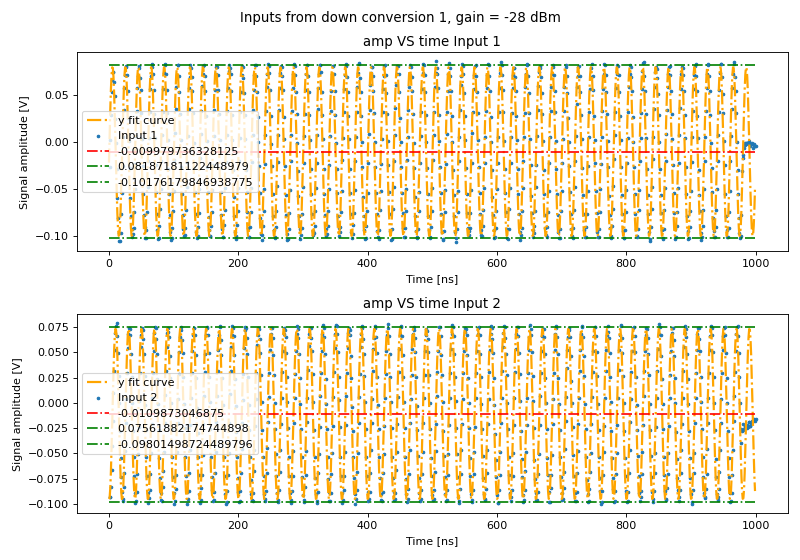

Amplitude=0.09006569540008331, Angular freq.=0.31416684234645553, phase=-0.4451908398353266, offset=-0.009979124512117951, Max. Cov.=8.635567910402254e-05
Amplitude=-0.08488863611132297, Angular freq.=0.31414057661716893, phase=1.1393717183399947, offset=-0.01099217291160975, Max. Cov.=9.354675071495522e-05
2023-11-16 13:19:17,851 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:17,920 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


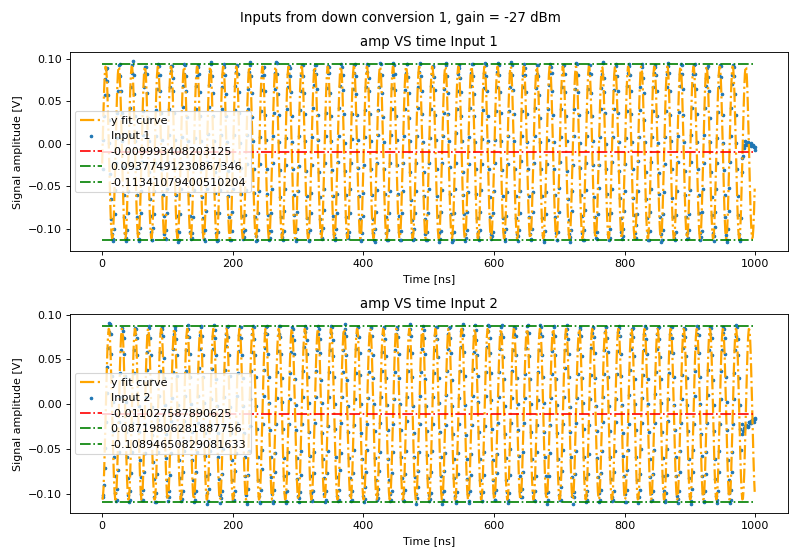

Amplitude=0.1017240598127391, Angular freq.=0.31417075127509986, phase=-0.4431277860960444, offset=-0.009992375120540672, Max. Cov.=8.613187970159186e-05
Amplitude=-0.09583690216197756, Angular freq.=0.3141382126654713, phase=1.1498303144633706, offset=-0.01103379566559444, Max. Cov.=9.170318801903604e-05
2023-11-16 13:19:18,491 - qm - INFO     - Sending program to QOP for compilation
2023-11-16 13:19:18,547 - qm - INFO     - Executing program


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


<IPython.core.display.Javascript object>


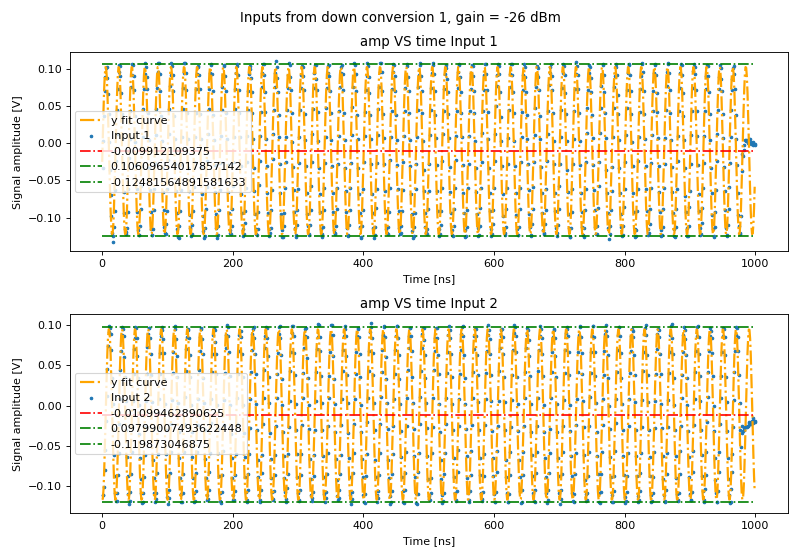

Amplitude=0.11322625683452003, Angular freq.=0.31416398971748033, phase=-0.44875431937450855, offset=-0.009911621603230628, Max. Cov.=8.692817209291128e-05
Amplitude=-0.10665286486761515, Angular freq.=0.3141371183339632, phase=1.1363320847762743, offset=-0.011001866946778495, Max. Cov.=9.136618395863952e-05
2023-11-16 13:19:19,142 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:19,211 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


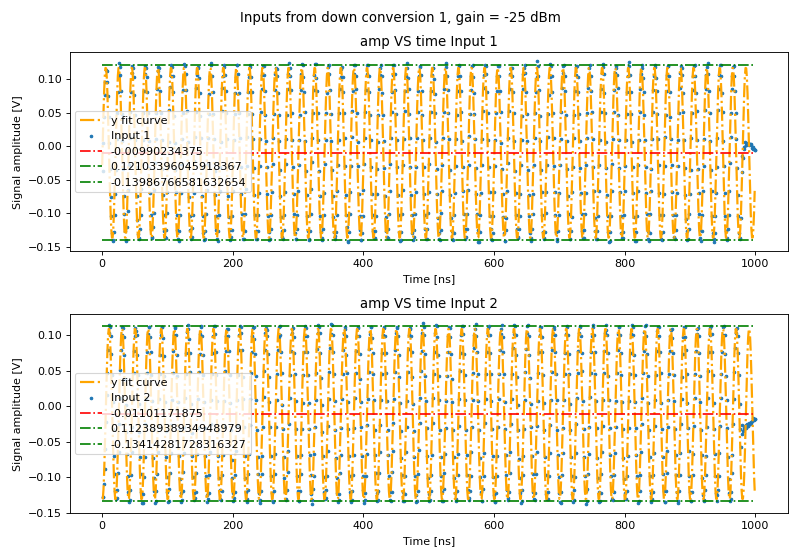

Amplitude=0.12801718190181136, Angular freq.=0.314158798526145, phase=-0.45938178284831566, offset=-0.009902400661565253, Max. Cov.=8.444855337021582e-05
Amplitude=-0.12092461113531111, Angular freq.=0.3141355503442423, phase=1.126233024321958, offset=-0.011020477523661375, Max. Cov.=9.205263049545467e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:20,082 - qm - INFO     - Sending program to QOP for compilation
2023-11-16 13:19:20,148 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


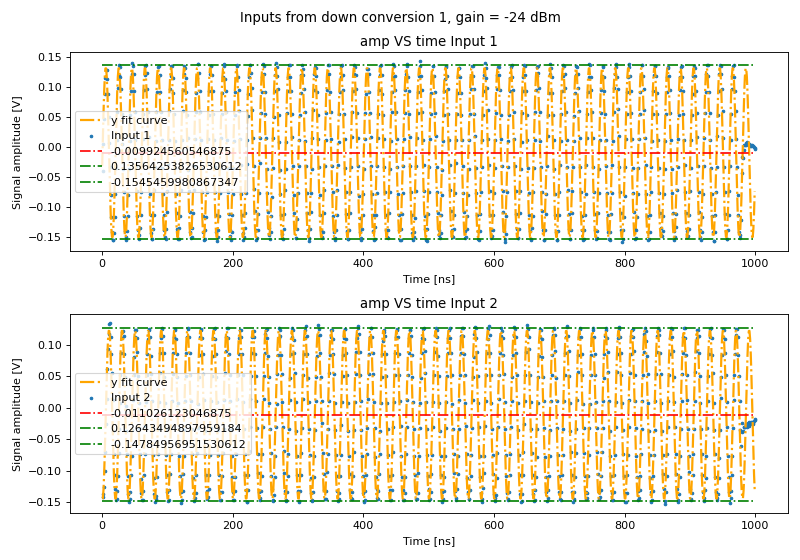

Amplitude=0.1422957410226573, Angular freq.=0.31415873805020983, phase=-0.4719297976142654, offset=-0.009924634865885951, Max. Cov.=8.583730080873756e-05
Amplitude=-0.13457595106674858, Angular freq.=0.314142545556437, phase=1.1090523005645734, offset=-0.01103296562893008, Max. Cov.=9.270620388868102e-05
2023-11-16 13:19:20,766 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3488487009.py:27: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], i)


2023-11-16 13:19:20,820 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


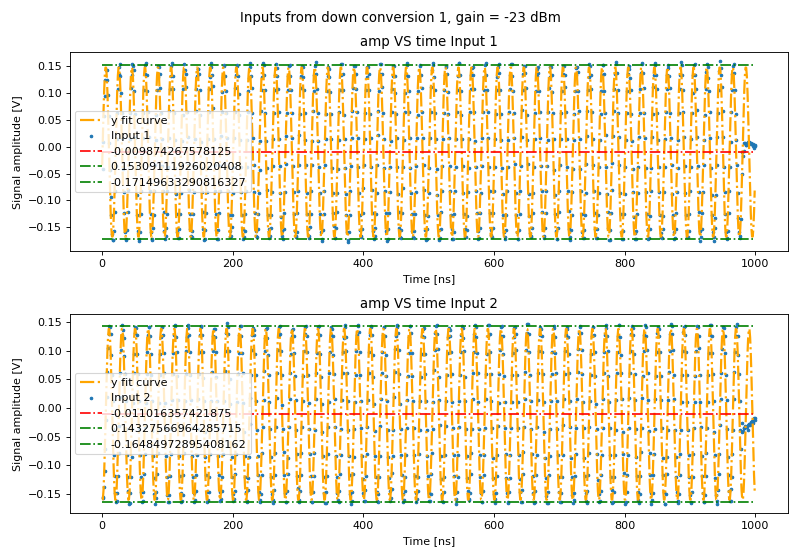

Amplitude=0.15926771791150682, Angular freq.=0.31416183862018343, phase=-0.46899799380794654, offset=-0.009873867164310796, Max. Cov.=8.812850589601221e-05
Amplitude=-0.15075632556389942, Angular freq.=0.3141377288247972, phase=1.1161025233737172, offset=-0.01102624573171742, Max. Cov.=9.359949795941776e-05
phase offset is 2.385290839353275e-05
{'input 1': {'signal amplitude': [0.03209479942560373, 0.03585534776783196, 0.04036260715080085, 0.045067224018741164, 0.051059052374386356, 0.05700243878092986, 0.06416723294161236, 0.07159893911600328, 0.0809383047341907, 0.09006569540008331, 0.1017240598127391, 0.11322625683452003, 0.12801718190181136, 0.1422957410226573, 0.15926771791150682], 'initial voltage': [0.0031585299705471203, 0.0035439289154197066, 0.0039763536438352535, 0.0044615421692140115, 0.005005932648504534, 0.005616748812614789, 0.0063020958209324355, 0.0070710678118654745, 0.007933868576533668, 0.008901946956877226, 0.009988148764833447, 0.011206887238456491, 0.012574334296

In [483]:
#Values given in dBm, OG value is at -30 dBm
trueStart = -37
trueEnd = -22

vals = voltCheck(trueStart+30, trueEnd+30, 1, 9e9) #Subtract start stop values by 10 to get dBM, -25 = -35 dbM, -14 = -24 dBm
print(vals)

<IPython.core.display.Javascript object>


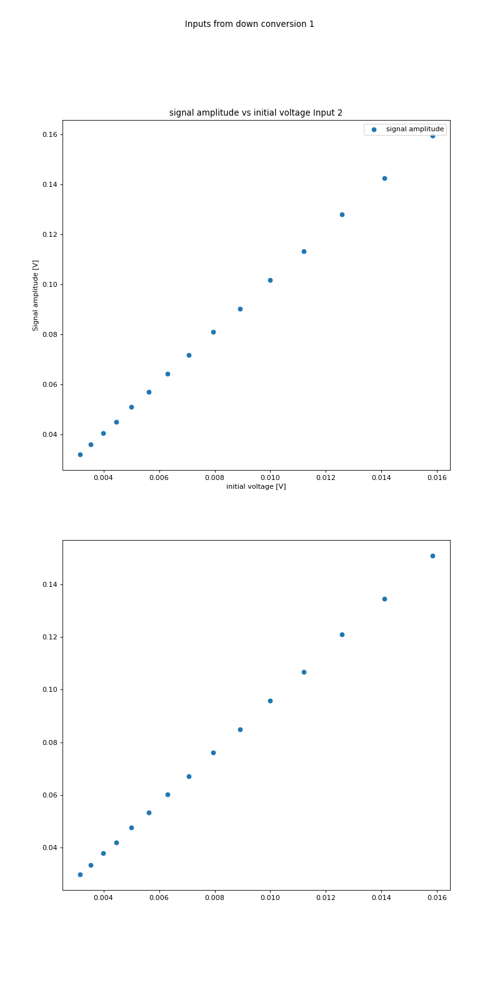

{'input 1': {'signal amplitude': [0.03209479942560373, 0.03585534776783196, 0.04036260715080085, 0.045067224018741164, 0.051059052374386356, 0.05700243878092986, 0.06416723294161236, 0.07159893911600328, 0.0809383047341907, 0.09006569540008331, 0.1017240598127391, 0.11322625683452003, 0.12801718190181136, 0.1422957410226573, 0.15926771791150682], 'initial voltage': [0.0031585299705471203, 0.0035439289154197066, 0.0039763536438352535, 0.0044615421692140115, 0.005005932648504534, 0.005616748812614789, 0.0063020958209324355, 0.0070710678118654745, 0.007933868576533668, 0.008901946956877226, 0.009988148764833447, 0.011206887238456491, 0.012574334296829354, 0.014108635131604638, 0.015830148982673417], 'freqs': [0.3141630134329669, 0.3141774556408381, 0.3141646818685636, 0.31416156489427055, 0.3141610221861611, 0.3141708915587268, 0.3141667339995455, 0.3141641644010107, 0.31416327671102234, 0.31416684234645553, 0.31417075127509986, 0.31416398971748033, 0.314158798526145, 0.31415873805020983,

In [485]:
"""
Here, we plot the signal amplitude from the voltcheck function versus the initial voltage we put into the I port on the OPX.
It should be linear.
"""

fig, (ax1, ax2) = plt.subplots(2,1, figsize=(10,20))
fig.suptitle("Inputs from down conversion 1")
        
# ax1.plot(np.ones(len(adc_1))*np.mean(adc_1), '-.', color = "red", label = np.mean(adc_1)) #-Taha addition to see the mean 
# ax1.plot(np.ones(len(adc_1))*findMaxAvgPeaks(adc_1, .05), '-.', color = "green", label = findMaxAvgPeaks(adc_1, .05)) #-Taha addition to see the mean 
ax1.scatter(y = "signal amplitude", x = "initial voltage", data = vals["input 1"]) #-Taha addition to see the mean 
#ax1.plot(np.array(vals["input 1"]["initial voltage"][0:5])*10)


ax1.set_title("signal amplitude vs initial voltage Input 1")
ax1.set_xlabel("initial voltage [V]")
ax1.set_ylabel("Signal amplitude [V]")
#ax1.set_yscale("log")
ax1.legend() #-Taha addition



ax2.scatter(y = "signal amplitude", x = "initial voltage", data = vals["input 2"]) #-Taha addition to see the mean 
#ax2.plot(np.array(vals["input 2"]["initial voltage"][0:1])*10)

         
ax1.set_title("signal amplitude vs initial voltage Input 2")
ax1.set_xlabel("initial voltage [V]")
ax1.set_ylabel("Signal amplitude [V]")
#ax2.set_yscale("log")
ax1.legend() #-Taha addition

print(vals)

<IPython.core.display.Javascript object>


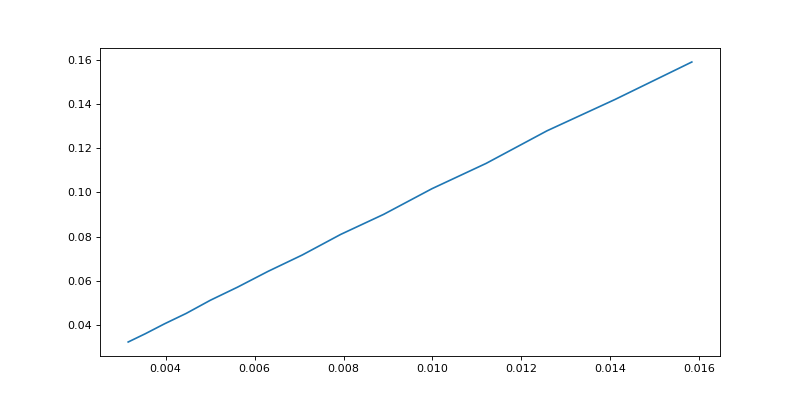

In [494]:
y = vals['input 1']['signal amplitude']
x = vals['input 1']['initial voltage']

fig,ax = plt.subplots(1,1, figsize = (10,5))

ax.plot(x,y)


## Checks LO frequency and signal amplitude dependence with a fixed input amplitude #

In [495]:
#qm.octave.set_lo_frequency(el, LO)
"""We've seen these functions before"""
with program() as hello_octave_readout_1:
    raw_ADC_1 = declare_stream(adc_trace=True)
    measure("readout", elements[0], raw_ADC_1)
    with stream_processing():
        raw_ADC_1.input1().save("adc_1")
        raw_ADC_1.input2().save("adc_2")
        
def amplitude(maximum, minimum, middle):
    return (np.absolute(maximum-middle)+np.absolute(minimum - middle) + np.absolute(maximum+minimum)/2)/3

def freqCheck(start, stop, step, gain = -20):
    print(f"gain at {gain-10} dBM")
    qm.octave.set_rf_output_gain(elements[0], gain)
    
    vals = {
        "input 1": {"signal amplitude" : [], "LO frequency": [], "freqs" : [], "phase" : [], "offset": [], "covariances": []},
        "input 2": {"signal amplitude" : [], "LO frequency": [], "freqs" : [], "phase" : [], "offset": [], "covariances": []}   
           }
    for i in range(start, stop, step):
        qm.octave.set_lo_frequency(elements[0], i)
        
        job = qm.execute(hello_octave_readout_1)
        res = job.result_handles
        res.wait_for_all_values()
        
        fig, (ax1, ax2) = plt.subplots(2,1, figsize=(10,7))
        fig.suptitle(f"Inputs from down conversion 1, freq = {i} GHz")
        adc_1 = u.raw2volts(res.get("adc_1").fetch_all())
        
        t = np.linspace(1, len(adc_1), len(adc_1))
        sine = fit_sin(t, adc_1)
        
        ax1.plot(sine["fitfunc"](t), "-.", label="y fit curve", linewidth=2, color = "orange")
        print( "Amplitude=%(amp)s, Angular freq.=%(omega)s, phase=%(phase)s, offset=%(offset)s, Max. Cov.=%(maxcov)s" % sine )
        
        vals["input 1"]["signal amplitude"].append(sine["amp"])
        vals["input 1"]["LO frequency"].append(i)
        vals["input 1"]["freqs"].append(sine["omega"])
        vals["input 1"]["phase"].append(sine["phase"])
        vals["input 1"]["offset"].append(sine["offset"])
        vals["input 1"]["covariances"].append(sine["maxcov"])
        
        phase1 = sine["omega"]
        
        ax1.scatter(t, adc_1, label="Input 1", s = 2)
        ax1.plot(np.ones(len(adc_1))*np.mean(adc_1), '-.', color = "red", label = np.mean(adc_1)) #-Taha addition to see the mean 
        ax1.plot(np.ones(len(adc_1))*findMaxAvgPeaks(adc_1, .05), '-.', color = "green", label = findMaxAvgPeaks(adc_1, .05)) #-Taha addition to see the mean 
        ax1.plot(np.ones(len(adc_1))*findMinAvgPeaks(adc_1, .05), '-.', color = "green", label = findMinAvgPeaks(adc_1, .05)) #-Taha addition to see the mean 

        ax1.set_title("amp VS time Input 1")
        ax1.set_xlabel("Time [ns]")
        ax1.set_ylabel("Signal amplitude [V]")
        ax1.legend() #-Taha addition
        
        adc_2 = u.raw2volts(res.get("adc_2").fetch_all())
        
        sine = fit_sin(t, adc_2)
        
        ax2.plot(sine["fitfunc"](t), "-.", label="y fit curve", linewidth=2, color = "orange")
        print( "Amplitude=%(amp)s, Angular freq.=%(omega)s, phase=%(phase)s, offset=%(offset)s, Max. Cov.=%(maxcov)s" % sine )
        
        vals["input 2"]["signal amplitude"].append(sine["amp"])
        vals["input 2"]["LO frequency"].append(i)
        vals["input 2"]["freqs"].append(sine["omega"])
        vals["input 2"]["phase"].append(sine["phase"])
        vals["input 2"]["offset"].append(sine["offset"])
        vals["input 2"]["covariances"].append(sine["maxcov"])
        
        phase2 = sine["omega"]
        ax2.scatter(t, adc_2, label="Input 1", s = 2)
        ax2.plot(np.ones(len(adc_2))*np.mean(adc_2), '-.', color = "red", label = np.mean(adc_2)) #-Taha addition to see the mean 
        ax2.plot(np.ones(len(adc_2))*findMaxAvgPeaks(adc_2, .05), '-.', color = "green", label = findMaxAvgPeaks(adc_2, .05)) #-Taha addition to see the mean 
        ax2.plot(np.ones(len(adc_2))*findMinAvgPeaks(adc_2, .05), '-.', color = "green", label = findMinAvgPeaks(adc_2, .05)) #-Taha addition to see the mean
        
        ax2.set_title("amp VS time Input 2")
        ax2.set_xlabel("Time [ns]")
        ax2.set_ylabel("Signal amplitude [V]")
        ax2.legend() #-Taha addition
        plt.tight_layout()
        
#         vals["input 1"]["signal amplitude"].append(amplitude(findMaxAvgPeaks(adc_1, .05), findMinAvgPeaks(adc_1, .05), np.mean(adc_1)))
#         vals["input 1"]["LO frequency"].append(i)
        
#         vals["input 2"]["signal amplitude"].append(amplitude(findMaxAvgPeaks(adc_2, .05), findMinAvgPeaks(adc_2, .05), np.mean(adc_2)))
#         vals["input 2"]["LO frequency"].append(i)
        
        
    return vals



gain at -25 dBM


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:15: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], gain)
C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:24,412 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:24,454 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


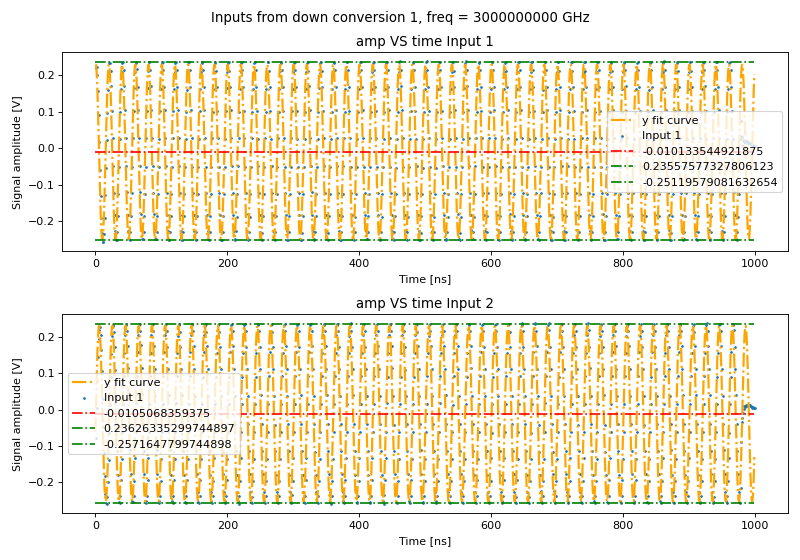

Amplitude=0.24067611333474404, Angular freq.=0.3141433177458996, phase=1.0980173084529707, offset=-0.010121913658768541, Max. Cov.=9.177202566967431e-05
Amplitude=0.24336009524916835, Angular freq.=0.3141641720070525, phase=-0.5199762364086888, offset=-0.010505489913820998, Max. Cov.=8.447296155582573e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:26,128 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:26,199 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


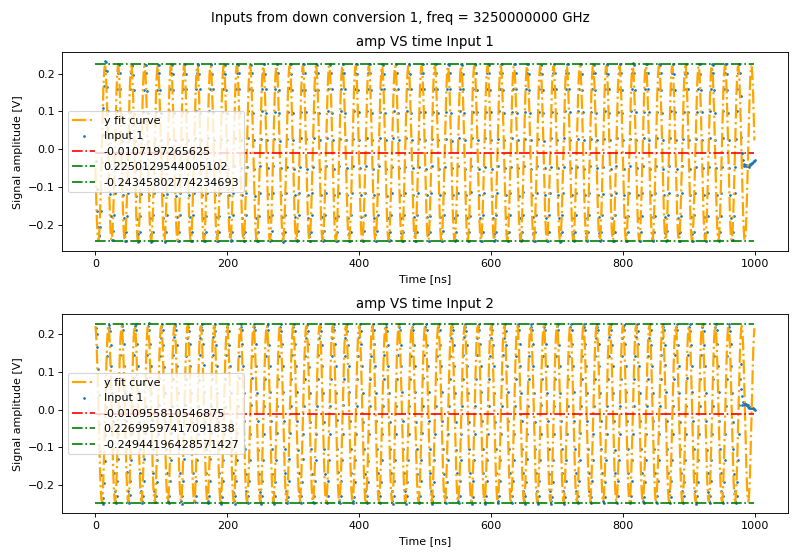

Amplitude=-0.23229863772873371, Angular freq.=0.3141596118847463, phase=-0.1461653967732619, offset=-0.010719723662918712, Max. Cov.=8.384403926518261e-05
Amplitude=0.2341307214621312, Angular freq.=0.31414536447324687, phase=1.345287460835217, offset=-0.010945437145837636, Max. Cov.=9.110338698176926e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:27,972 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:28,036 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


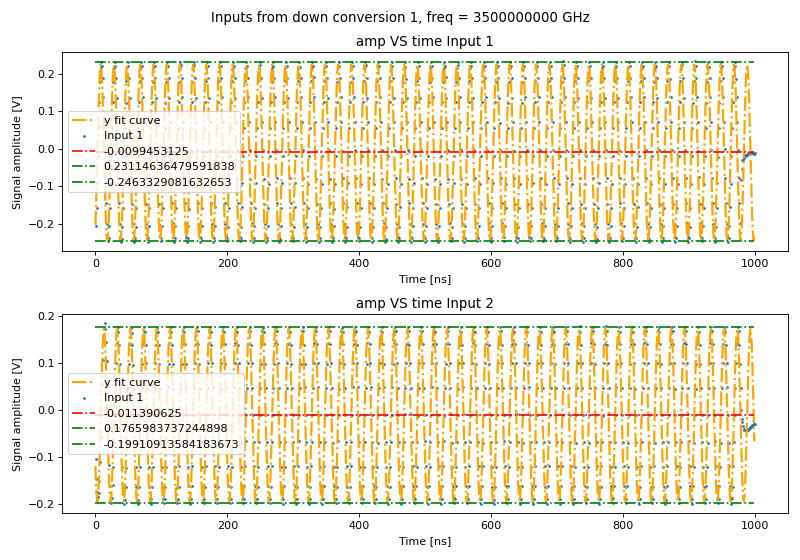

Amplitude=0.23380997900455064, Angular freq.=0.31415688443806083, phase=-1.2875188885129871, offset=-0.009946922956593642, Max. Cov.=9.080146520435747e-05
Amplitude=-0.18376130640433033, Angular freq.=0.31414873170334223, phase=0.3182147949828652, offset=-0.011393427123759658, Max. Cov.=8.521260454431445e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:29,824 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:29,897 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


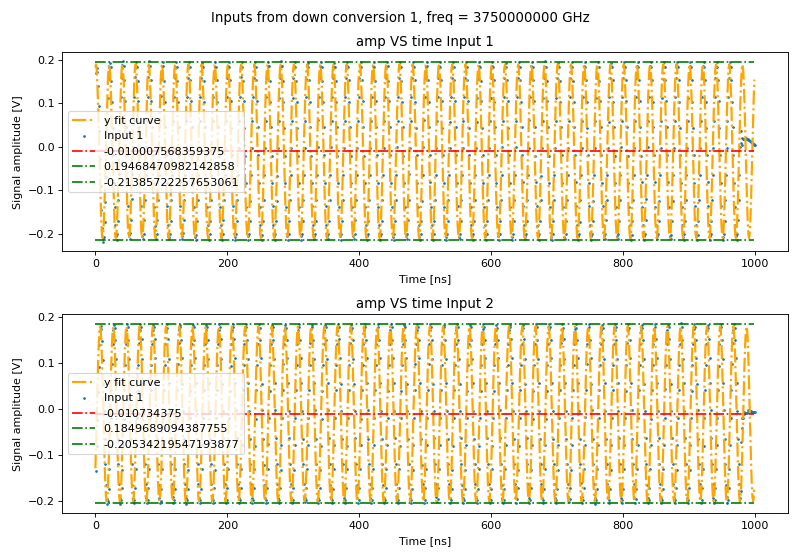

Amplitude=0.19979799858913405, Angular freq.=0.3141399887213098, phase=0.9888953619516401, offset=-0.009996401434513996, Max. Cov.=9.240864152322444e-05
Amplitude=0.1910816754048435, Angular freq.=0.3141638618246903, phase=-0.9847983300442505, offset=-0.010732312201073504, Max. Cov.=8.89661849588328e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:31,674 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:31,738 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


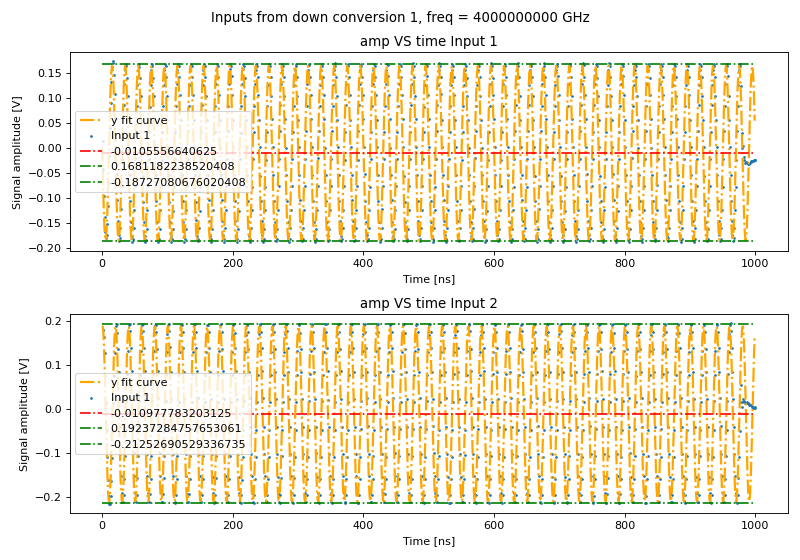

Amplitude=-0.17471723457088043, Angular freq.=0.31416312440548877, phase=-0.383034015116173, offset=-0.010556142813653214, Max. Cov.=8.46075437538311e-05
Amplitude=0.199992362960274, Angular freq.=0.3141428199981372, phase=1.0868468989304294, offset=-0.010967855266912298, Max. Cov.=9.175120900084462e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:33,487 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:33,552 - qm - INFO     - Executing program


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2,1, figsize=(10,7))


<IPython.core.display.Javascript object>


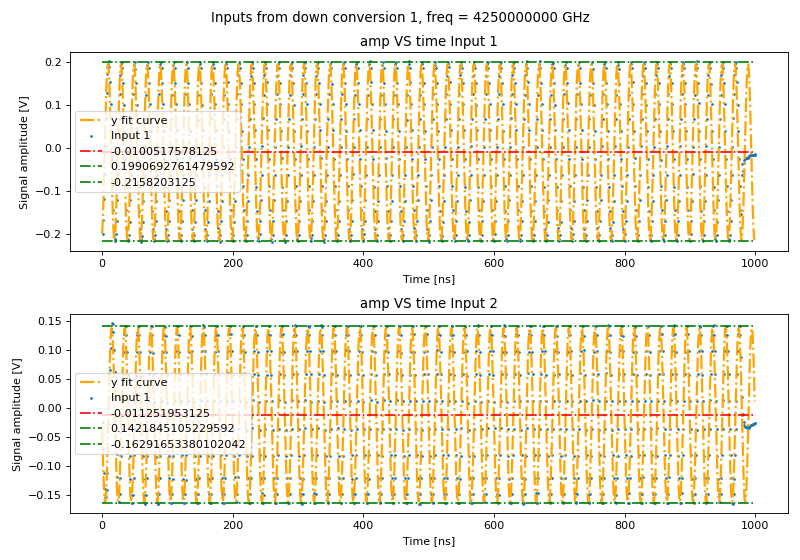

Amplitude=0.20413347647025465, Angular freq.=0.31415249397236805, phase=-1.5005802977753064, offset=-0.010056065703052688, Max. Cov.=9.121579622764649e-05
Amplitude=-0.15093983035475708, Angular freq.=0.3141604841973991, phase=-0.1552226448007753, offset=-0.011251951661639878, Max. Cov.=8.386159728874703e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:35,323 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:35,390 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


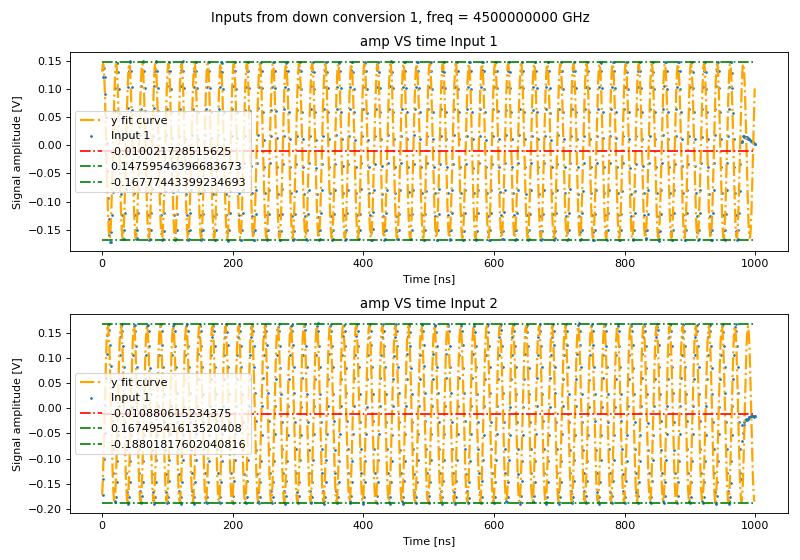

Amplitude=0.15573524024271956, Angular freq.=0.314143002107716, phase=0.8089297543299103, offset=-0.01001510657200301, Max. Cov.=8.758057339683724e-05
Amplitude=0.17511466578092608, Angular freq.=0.31415133508098686, phase=-1.4811301613670602, offset=-0.010884923793009042, Max. Cov.=9.060825775249584e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:37,143 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:37,210 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


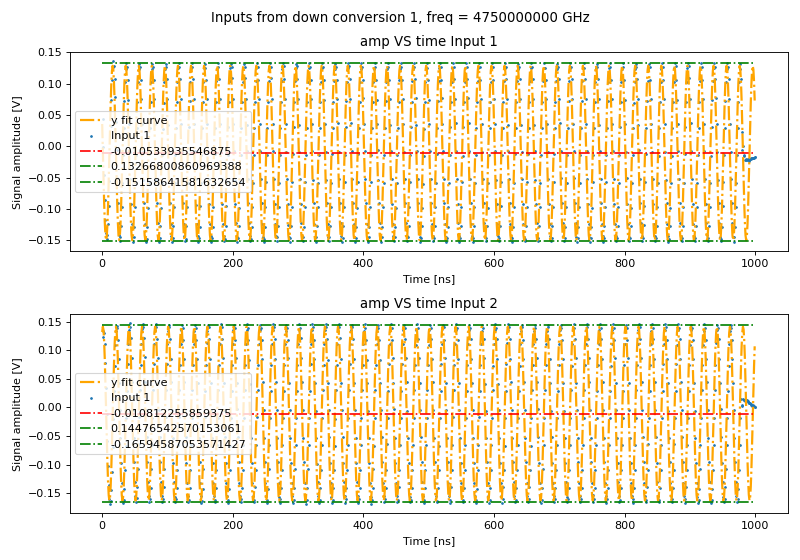

Amplitude=-0.1392098412602424, Angular freq.=0.3141673046703981, phase=-0.6529041459437075, offset=-0.010535624633468275, Max. Cov.=8.58549436257241e-05
Amplitude=0.15198259374839815, Angular freq.=0.31414079494212227, phase=0.9036227988795725, offset=-0.010804466175255574, Max. Cov.=8.893312569215906e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:39,013 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:39,063 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


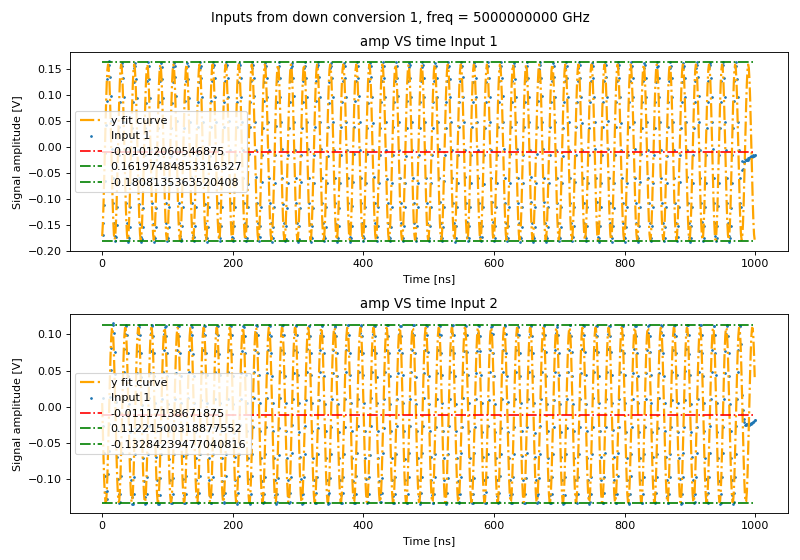

Amplitude=0.1681068256425003, Angular freq.=0.3141482812348578, phase=-1.5972465921525567, offset=-0.010126461345047596, Max. Cov.=9.353991027263456e-05
Amplitude=-0.12108064933015139, Angular freq.=0.3141644286103082, phase=-0.4494300689190085, offset=-0.011171957606561346, Max. Cov.=8.422767936128604e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:40,829 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:40,899 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


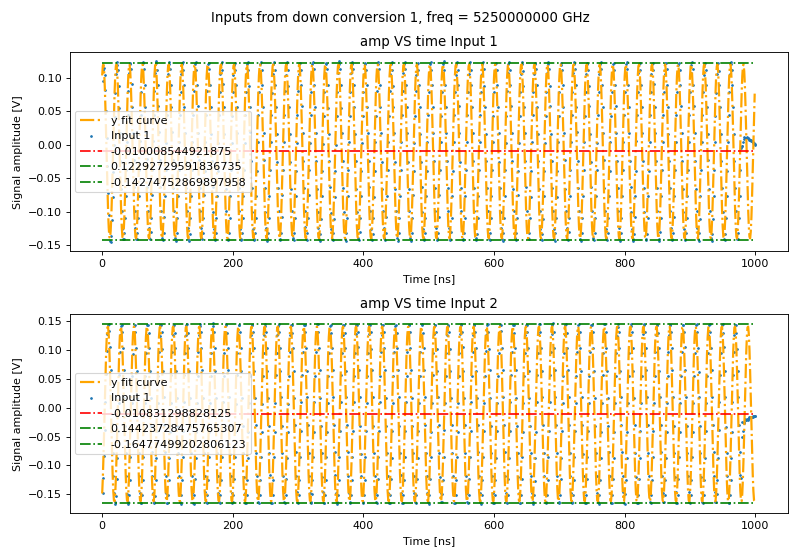

Amplitude=0.13071280118979225, Angular freq.=0.31414208885482825, phase=0.7396517450126955, offset=-0.01000297674452241, Max. Cov.=8.901909582570578e-05
Amplitude=0.15256602542109396, Angular freq.=0.314153507748639, phase=-1.4424335465065898, offset=-0.010833995166782559, Max. Cov.=9.284294875005721e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:42,690 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:42,757 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


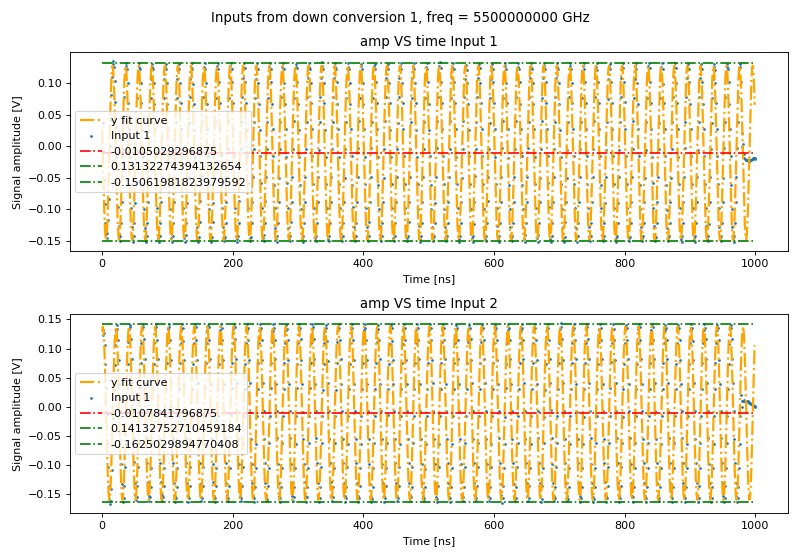

Amplitude=-0.1381908152835117, Angular freq.=0.3141654432562371, phase=-0.5889364910750989, offset=-0.010504064113820894, Max. Cov.=8.616459539601606e-05
Amplitude=0.14859252905962847, Angular freq.=0.31414075330566044, phase=0.9199814402284567, offset=-0.010776476295349165, Max. Cov.=8.982698158641057e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:44,550 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:44,620 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


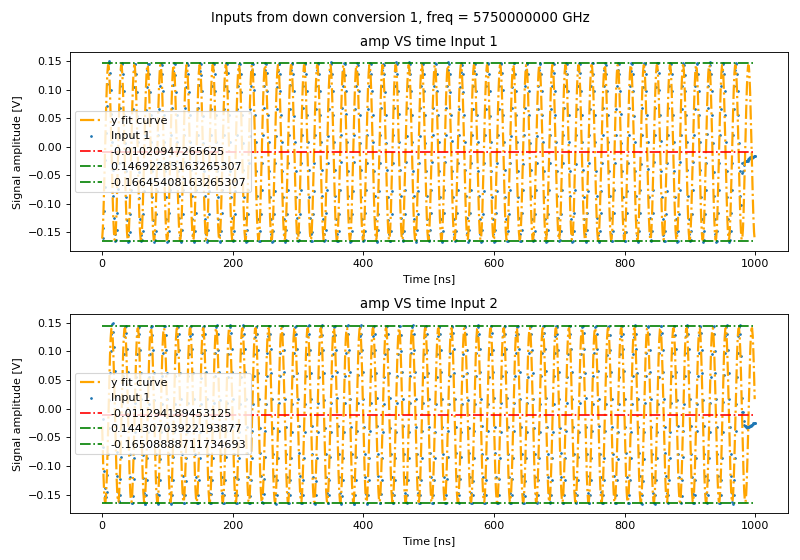

Amplitude=0.15455441414934742, Angular freq.=0.31414694330030124, phase=-1.6827905184558594, offset=-0.01021555522899352, Max. Cov.=9.173075391490978e-05
Amplitude=-0.15284848907049822, Angular freq.=0.31415929376012247, phase=-0.18266787281702307, offset=-0.011294189803387724, Max. Cov.=8.394682500075441e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:46,386 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:46,449 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


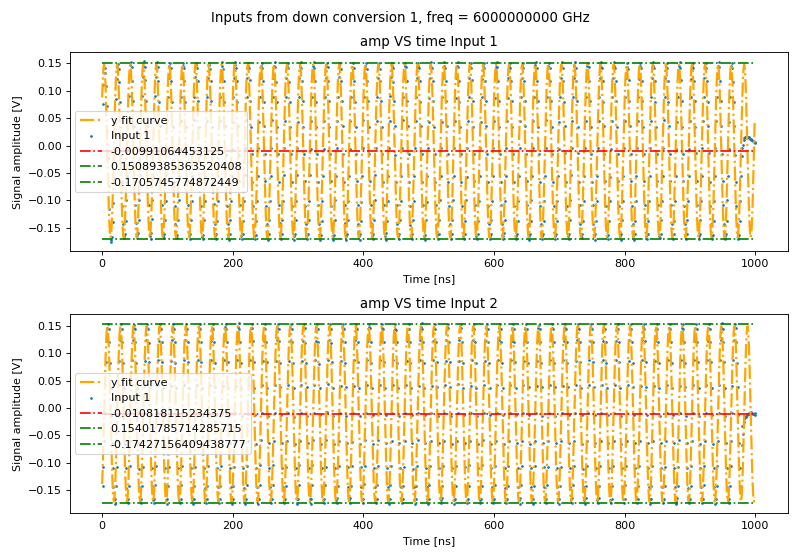

Amplitude=0.1576719710401418, Angular freq.=0.3141459963227567, phase=0.3520555949241448, offset=-0.009907423883189017, Max. Cov.=8.496025059545418e-05
Amplitude=0.1607992026985664, Angular freq.=0.3141560010433776, phase=-1.2409466354135716, offset=-0.010819599249541106, Max. Cov.=8.823542850191628e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:48,228 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:48,290 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


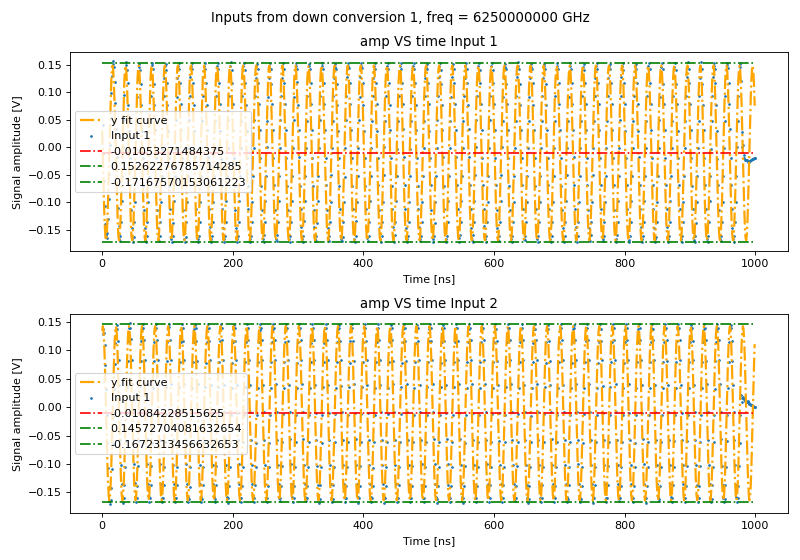

Amplitude=-0.15905261888634245, Angular freq.=0.31416437908969114, phase=-0.5746242660051077, offset=-0.010533762947368217, Max. Cov.=8.512807468149843e-05
Amplitude=0.15320836837419763, Angular freq.=0.31414254690715204, phase=0.9341745923590735, offset=-0.010835053323490877, Max. Cov.=8.723685551472603e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:50,046 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:50,113 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


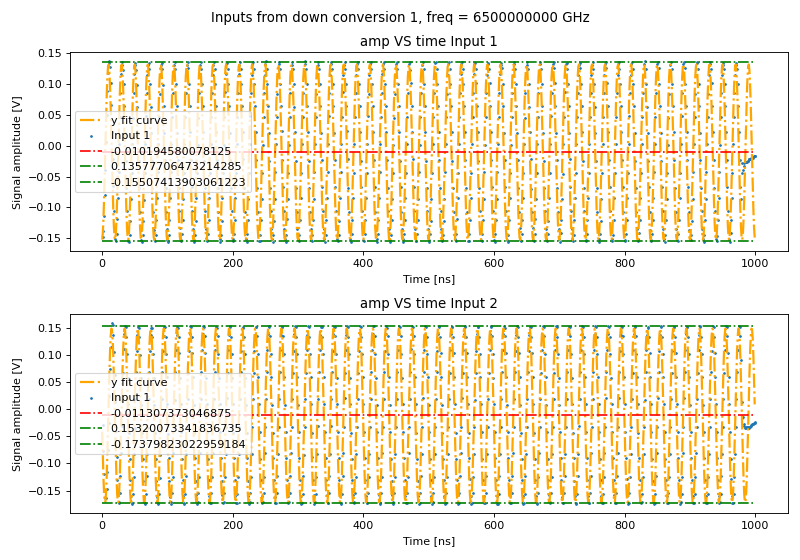

Amplitude=0.142773700555357, Angular freq.=0.3141450882292661, phase=-1.7910715762812774, offset=-0.010201033863051058, Max. Cov.=9.127098633555597e-05
Amplitude=-0.16169281897703056, Angular freq.=0.3141603505623757, phase=-0.12745362472320348, offset=-0.011307356052989947, Max. Cov.=8.335045823461833e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:51,881 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:51,945 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>

Amplitude=0.1619656469700153, Angular freq.=0.31415612209896454, phase=0.06707954123648827, offset=-0.00987757044813525, Max. Cov.=8.304962385188746e-05
Amplitude=0.15150865004468253, Angular freq.=0.314157195063979, phase=-1.2634763118980372, offset=-0.01082560386892652, Max. Cov.=9.027209764513111e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:53,739 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:53,804 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


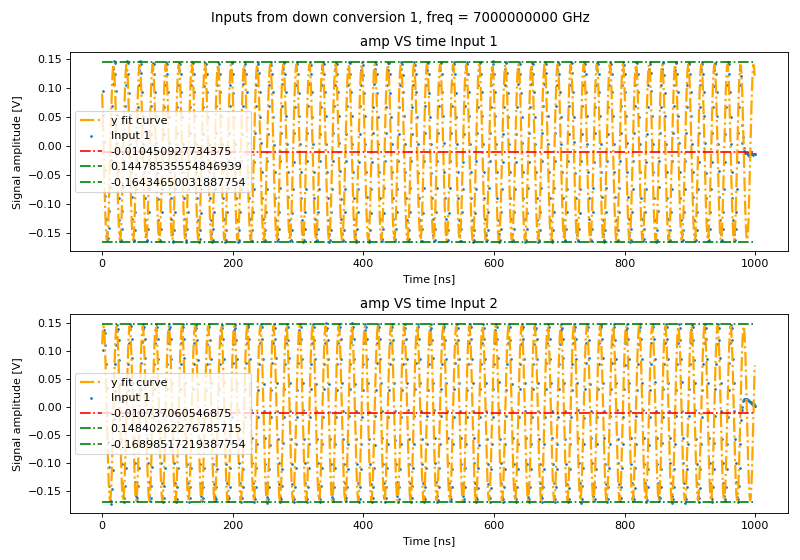

Amplitude=-0.1519572723449248, Angular freq.=0.3141618102589818, phase=-1.041916286645003, offset=-0.010451883164583972, Max. Cov.=8.854836782777474e-05
Amplitude=0.1556741178594197, Angular freq.=0.31414321939815004, phase=0.5999694633980519, offset=-0.01073162390186394, Max. Cov.=8.612204686109908e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:55,571 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:55,637 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


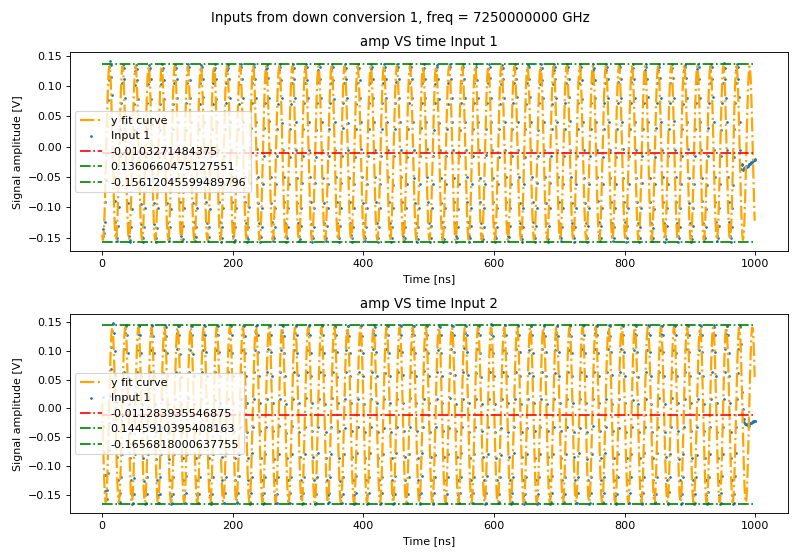

Amplitude=-0.14321588286760173, Angular freq.=0.31413956981418084, phase=0.9118625552387372, offset=-0.010335009629725953, Max. Cov.=8.808057645816265e-05
Amplitude=-0.15328633208281073, Angular freq.=0.31416399593228156, phase=-0.4476899919473203, offset=-0.011284594380712713, Max. Cov.=8.399817621526359e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:57,416 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:57,476 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


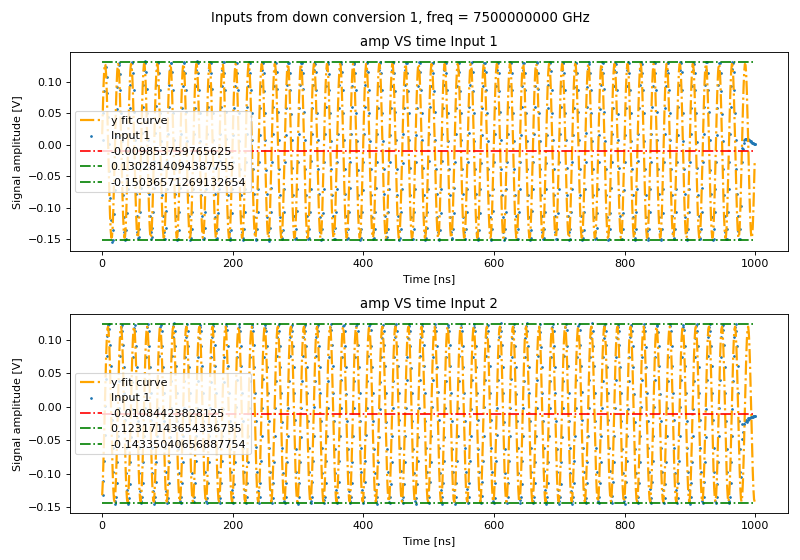

Amplitude=0.13871263926693372, Angular freq.=0.3141625716655346, phase=-0.12248536320610852, offset=-0.009853812908472063, Max. Cov.=8.252280440196846e-05
Amplitude=0.13096033153154057, Angular freq.=0.3141518773636889, phase=-1.4963034702901694, offset=-0.01084725089267223, Max. Cov.=9.185802581825346e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:37:59,260 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:37:59,310 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>

Amplitude=0.1228178061479869, Angular freq.=0.31415968091631247, phase=1.9826520258450415, offset=-0.010384414750264408, Max. Cov.=9.172937053663275e-05
Amplitude=0.12969893417181258, Angular freq.=0.3141444424775134, phase=0.5459591163396875, offset=-0.010789518899387307, Max. Cov.=8.634352920212954e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:38:01,114 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:38:01,181 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


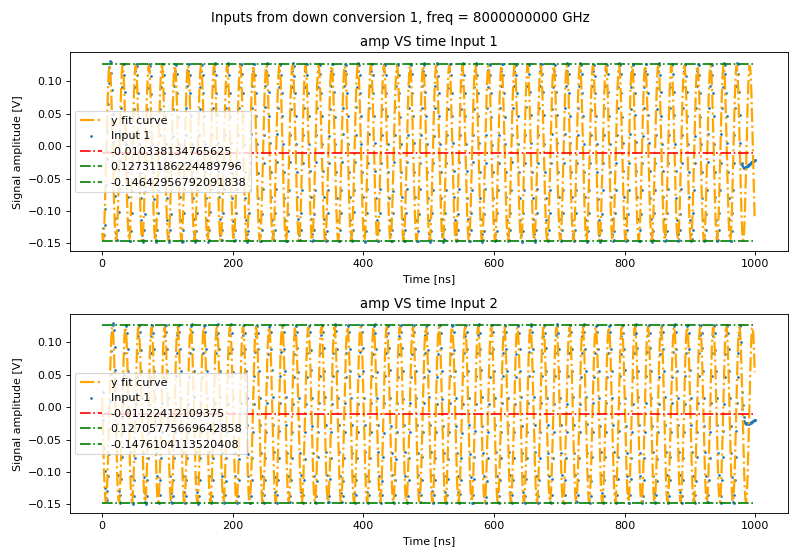

Amplitude=-0.13520162267418762, Angular freq.=0.31414073567448225, phase=0.8421217590102067, offset=-0.010344829071802179, Max. Cov.=8.759917277937105e-05
Amplitude=-0.13560633222020943, Angular freq.=0.3141648927999579, phase=-0.5071831301107146, offset=-0.01122495123063855, Max. Cov.=8.432606023258726e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:38:02,957 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:38:03,021 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


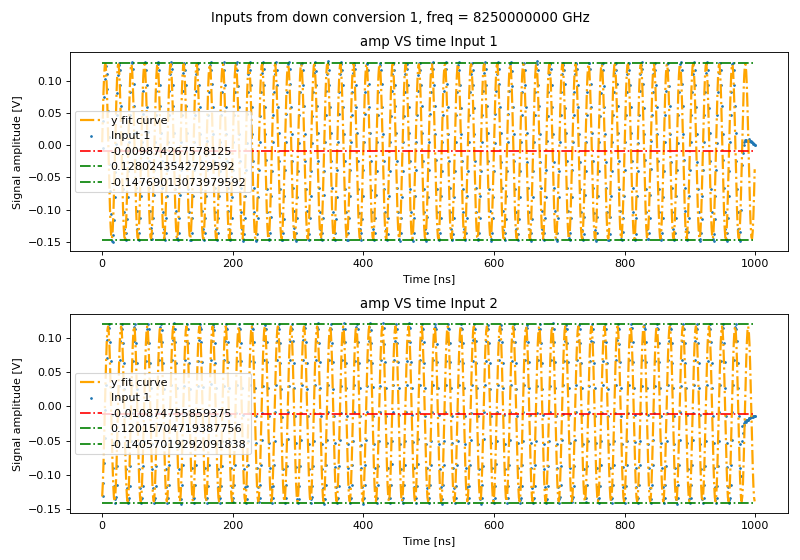

Amplitude=0.13599546213232142, Angular freq.=0.31416382078489896, phase=-0.20923923883541068, offset=-0.009874168853069083, Max. Cov.=8.396694493785907e-05
Amplitude=0.1276542217288893, Angular freq.=0.31414980690084493, phase=-1.5498449958088405, offset=-0.01087855731605874, Max. Cov.=9.096679105909245e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:38:04,831 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:38:04,900 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


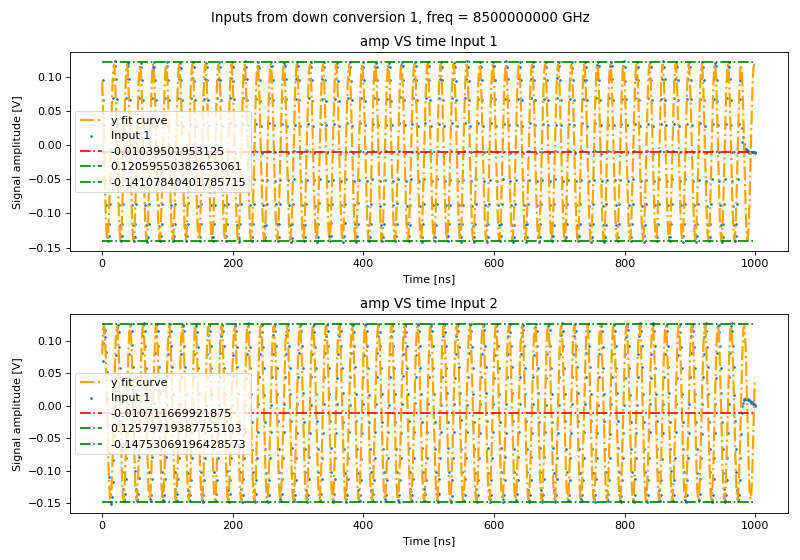

Amplitude=0.12803314624107448, Angular freq.=0.3141574960356906, phase=1.8945004210015037, offset=-0.010394377278064857, Max. Cov.=9.065027630588926e-05
Amplitude=0.13461541384067688, Angular freq.=0.3141467759434219, phase=0.416150484606138, offset=-0.010708783678937158, Max. Cov.=8.433228365275889e-05


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\3381987869.py:22: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], i)


2023-11-15 17:38:06,696 - qm - INFO     - Sending program to QOP for compilation
2023-11-15 17:38:06,765 - qm - INFO     - Executing program


<IPython.core.display.Javascript object>


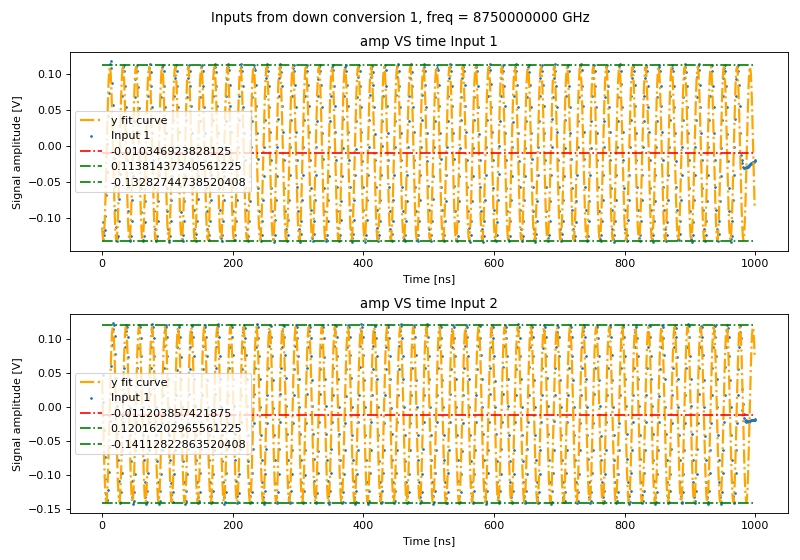

Amplitude=-0.121236815090986, Angular freq.=0.31414342018345703, phase=0.7062459708218436, offset=-0.010351558656716787, Max. Cov.=8.618631117090734e-05
Amplitude=-0.1284956173813967, Angular freq.=0.314166350050723, phase=-0.7201926248133123, offset=-0.011205401892411874, Max. Cov.=8.590856965044356e-05
{'input 1': {'signal amplitude': [0.24067611333474404, -0.23229863772873371, 0.23380997900455064, 0.19979799858913405, -0.17471723457088043, 0.20413347647025465, 0.15573524024271956, -0.1392098412602424, 0.1681068256425003, 0.13071280118979225, -0.1381908152835117, 0.15455441414934742, 0.1576719710401418, -0.15905261888634245, 0.142773700555357, 0.1619656469700153, -0.1519572723449248, -0.14321588286760173, 0.13871263926693372, 0.1228178061479869, -0.13520162267418762, 0.13599546213232142, 0.12803314624107448, -0.121236815090986], 'LO frequency': [3000000000, 3250000000, 3500000000, 3750000000, 4000000000, 4250000000, 4500000000, 4750000000, 5000000000, 5250000000, 5500000000, 57500000

In [422]:
trueGain = -35

vals = freqCheck(3*10**9, 9*10**9, 25*10**7, gain = trueGain+10)
print(vals)

<IPython.core.display.Javascript object>


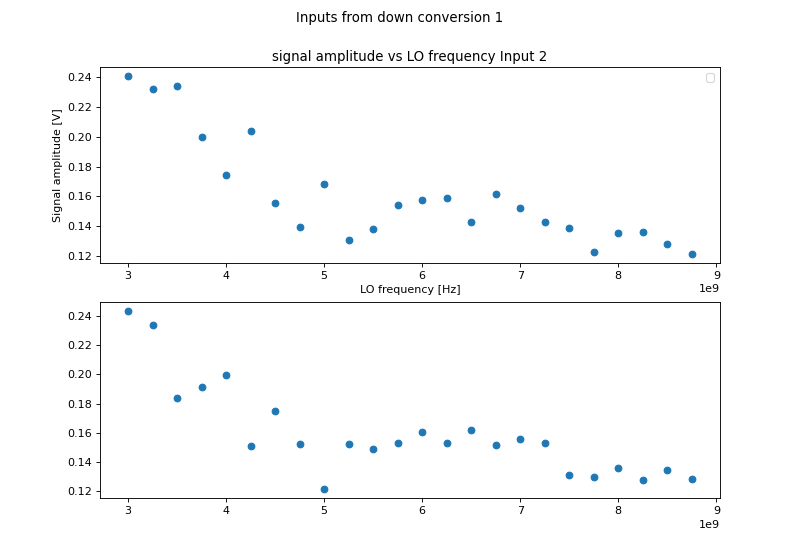

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [425]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(10,7))
fig.suptitle("Inputs from down conversion 1")
        
# ax1.plot(np.ones(len(adc_1))*np.mean(adc_1), '-.', color = "red", label = np.mean(adc_1)) #-Taha addition to see the mean 
# ax1.plot(np.ones(len(adc_1))*findMaxAvgPeaks(adc_1, .05), '-.', color = "green", label = findMaxAvgPeaks(adc_1, .05)) #-Taha addition to see the mean 
ax1.scatter(y = np.absolute(vals["input 1"]["signal amplitude"]), x = vals["input 1"]["LO frequency"]) #-Taha addition to see the mean 

ax1.set_title("signal amplitude vs initial voltage Input 1")
ax1.set_xlabel("LO frequency [Hz]")
ax1.set_ylabel("Signal amplitude [mV]")
ax1.legend() #-Taha addition

ax2.scatter(y = np.absolute(vals["input 2"]["signal amplitude"]), x = vals["input 2"]["LO frequency"]) #-Taha addition to see the mean 

ax1.set_title("signal amplitude vs LO frequency Input 2")
ax1.set_xlabel("LO frequency [Hz]")
ax1.set_ylabel("Signal amplitude [V]")
ax1.legend() #-Taha addition



<IPython.core.display.Javascript object>


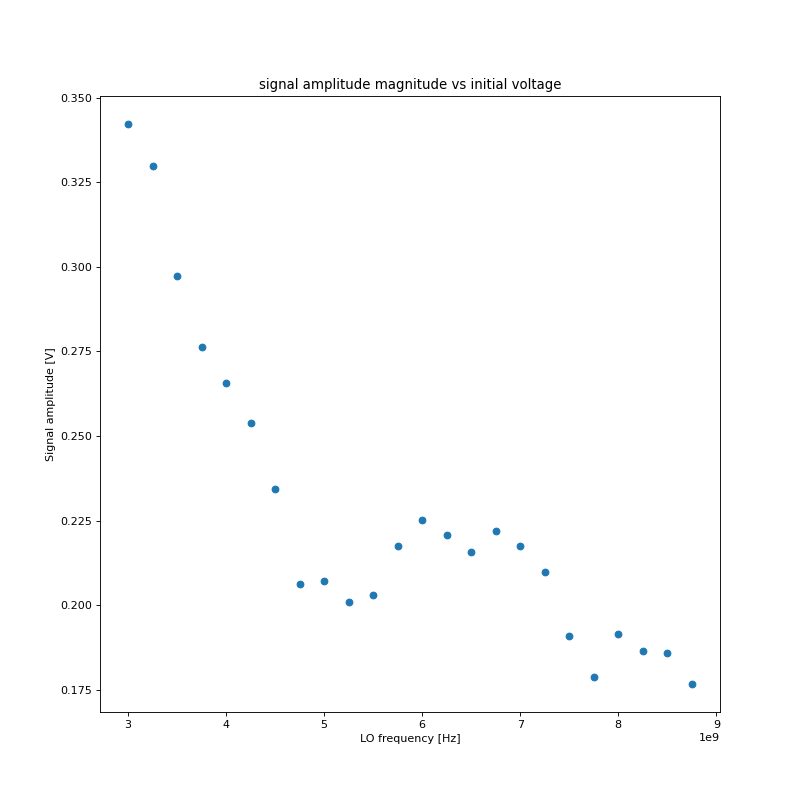

In [424]:
I = vals["input 1"]["signal amplitude"]
Q = vals["input 2"]["signal amplitude"]

iSquaredqSquared = []

for i in range(len(I)):
    iSquaredqSquared.append(np.sqrt(I[i]**2 + Q[i]**2))
    
fig = plt.figure(figsize = (10, 10))
ax1 = plt.axes()
plt.title("Inputs from down conversion 1")
        
# ax1.plot(np.ones(len(adc_1))*np.mean(adc_1), '-.', color = "red", label = np.mean(adc_1)) #-Taha addition to see the mean 
# ax1.plot(np.ones(len(adc_1))*findMaxAvgPeaks(adc_1, .05), '-.', color = "green", label = findMaxAvgPeaks(adc_1, .05)) #-Taha addition to see the mean 
plt.scatter(y = iSquaredqSquared, x = vals["input 1"]["LO frequency"]) #-Taha addition to see the mean 

ax1.set_title("signal amplitude magnitude vs initial voltage")
ax1.set_xlabel("LO frequency [Hz]")
ax1.set_ylabel("Signal amplitude [V]")
#ax1.legend() #-Taha addition
plt.show()

    

# Demodulation #

In [502]:
""" demod is a program that gives us an I and a Q value that we can plot """



with program() as demod:
    
    I = declare(fixed) # I and Q are 2 variables that are associated with signal z = I + iQ
    Q = declare(fixed)
    
    raw_ADC_1 = declare_stream(adc_trace=True) #ADC Stream we are using
    
    #Run the readout pulse for qe1
    measure('readout', 'qe1', raw_ADC_1,
            dual_demod.full('cos', 'out1', 'sin', 'out2', I),  
            dual_demod.full('minus_sin', 'out1', 'cos', 'out2', Q))
    
    #Save our 2 demodulated ADC streams
    save(I, 'I')
    save(Q, 'Q')


In [557]:
"""This is a function that is identical to """

def IQCheck(start, stop, step, LO = 3e9):
    u = unit()
    
    def toVolts(dBm, impedance = 50):
        impFactor = np.sqrt(impedance/1000)
        powerFactor = 10**(dBm/20)
        return impFactor*powerFactor
    
    phases = []
    print(f"LO Frequency at {LO}")
    qm.octave.set_lo_frequency(elements[0], LO)
    vals = {
        "input 1": {"signal amplitude" : [], "initial voltage": [], "freqs" : [], "phase" : [], "offset": [], "covariances": []},
        "input 2": {"signal amplitude" : [], "initial voltage": [], "freqs" : [], "phase" : [], "offset": [], "covariances": []}   
           }
    input_voltages = []
    Is = []
    Qs = []
    
    for input_voltage_dB in range(start, stop, step):
        
        rf_gain_dB = input_voltage_dB+30 #gain to get input voltage given -30 dB initial voltage = 0.01 V amplitude
        
        qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage
                                                        
        input_voltages.append(toVolts(input_voltage_dB))
        
        job = qm.execute(demod)
        res = job.result_handles
        res.wait_for_all_values()
        
        I = res.get("I").fetch(0)
        Q = res.get("Q").fetch(0)
        
        print(f"at {toVolts(input_voltage_dB)} volts, I : {(I[0][0])}, Q: {(Q[0][0])}")
        
        
        Is.append(I[0][0])
        Qs.append(Q[0][0])
        
    return {"I" : np.array(Is),
            "Q" : np.array(Qs),
            "input voltages" : np.array(input_voltages)
            }

In [558]:
start_voltage_dBm = -35
end_voltage_dBm = -25

vals = IQCheck(start_voltage_dBm, end_voltage_dBm, 1)
print(vals)

LO Frequency at 3000000000.0


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2751256639.py:13: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_lo_frequency(elements[0], LO)


2023-11-20 18:13:11,349 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2751256639.py:26: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage


2023-11-20 18:13:11,427 - qm - INFO     - Executing program
at 0.0039763536438352535 volts, I : -0.00824006274342537, Q: 0.008674819022417068
2023-11-20 18:13:11,820 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2751256639.py:26: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage


2023-11-20 18:13:11,903 - qm - INFO     - Executing program
at 0.0044615421692140115 volts, I : -0.00919082760810852, Q: 0.009712371975183487


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2751256639.py:26: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage


2023-11-20 18:13:12,428 - qm - INFO     - Sending program to QOP for compilation
2023-11-20 18:13:12,506 - qm - INFO     - Executing program
at 0.005005932648504534 volts, I : -0.010351542383432388, Q: 0.010926216840744019


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2751256639.py:26: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage


2023-11-20 18:13:12,949 - qm - INFO     - Sending program to QOP for compilation
2023-11-20 18:13:13,022 - qm - INFO     - Executing program
at 0.005616748812614789 volts, I : -0.011555008590221405, Q: 0.012223374098539352
2023-11-20 18:13:13,391 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2751256639.py:26: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage


2023-11-20 18:13:13,465 - qm - INFO     - Executing program
at 0.0063020958209324355 volts, I : -0.013051025569438934, Q: 0.013774905353784561
2023-11-20 18:13:13,717 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2751256639.py:26: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage


2023-11-20 18:13:13,786 - qm - INFO     - Executing program
at 0.0070710678118654745 volts, I : -0.014593202620744705, Q: 0.015408053994178772


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2751256639.py:26: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage


2023-11-20 18:13:14,241 - qm - INFO     - Sending program to QOP for compilation
2023-11-20 18:13:14,311 - qm - INFO     - Executing program
at 0.007933868576533668 volts, I : -0.016476769000291824, Q: 0.01733335852622986


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2751256639.py:26: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage


2023-11-20 18:13:14,760 - qm - INFO     - Sending program to QOP for compilation
2023-11-20 18:13:14,848 - qm - INFO     - Executing program
at 0.008901946956877226 volts, I : -0.018406398594379425, Q: 0.01939711719751358
2023-11-20 18:13:15,191 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2751256639.py:26: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage


2023-11-20 18:13:15,267 - qm - INFO     - Executing program
at 0.009988148764833447 volts, I : -0.020776454359292984, Q: 0.02171109989285469
2023-11-20 18:13:15,629 - qm - INFO     - Sending program to QOP for compilation


C:\Users\measPC\AppData\Local\Temp\ipykernel_6732\2751256639.py:26: DeprecationWarning: QuantumMachine.octave is deprecated since "1.1.0" and will be removed in "1.2.0". Use ElementWithOctave instead. For further details, see elements API.
  qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage


2023-11-20 18:13:15,701 - qm - INFO     - Executing program
at 0.011206887238456491 volts, I : -0.02323024347424507, Q: 0.024256423115730286
{'I': array([-0.00824006, -0.00919083, -0.01035154, -0.01155501, -0.01305103,
       -0.0145932 , -0.01647677, -0.0184064 , -0.02077645, -0.02323024]), 'Q': array([0.00867482, 0.00971237, 0.01092622, 0.01222337, 0.01377491,
       0.01540805, 0.01733336, 0.01939712, 0.0217111 , 0.02425642]), 'input voltages': array([0.00397635, 0.00446154, 0.00500593, 0.00561675, 0.0063021 ,
       0.00707107, 0.00793387, 0.00890195, 0.00998815, 0.01120689])}


In [593]:

I = vals["I"]
print(I)
Q = vals["Q"]
print(Q)
input_voltages = Q = vals["input voltages"]
print(input_voltages)
vals

[-0.00824006 -0.00919083 -0.01035154 -0.01155501 -0.01305103 -0.0145932
 -0.01647677 -0.0184064  -0.02077645 -0.02323024]
[0.00867482 0.00971237 0.01092622 0.01222337 0.01377491 0.01540805
 0.01733336 0.01939712 0.0217111  0.02425642]
[0.00397635 0.00446154 0.00500593 0.00561675 0.0063021  0.00707107
 0.00793387 0.00890195 0.00998815 0.01120689]


{'I': array([-0.00824006, -0.00919083, -0.01035154, -0.01155501, -0.01305103,
        -0.0145932 , -0.01647677, -0.0184064 , -0.02077645, -0.02323024]),
 'Q': array([0.00867482, 0.00971237, 0.01092622, 0.01222337, 0.01377491,
        0.01540805, 0.01733336, 0.01939712, 0.0217111 , 0.02425642]),
 'input voltages': array([0.00397635, 0.00446154, 0.00500593, 0.00561675, 0.0063021 ,
        0.00707107, 0.00793387, 0.00890195, 0.00998815, 0.01120689])}

In [607]:
%matplotlib inline

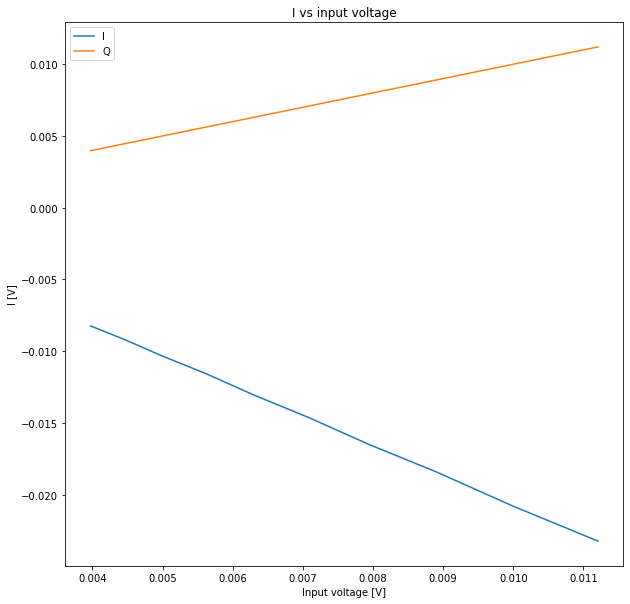

In [623]:
"""
Here, we plot the signal amplitude from the voltcheck function versus the initial voltage we put into the I port on the OPX.
It should be linear.
"""

fig, ax = plt.subplots(1,1, figsize=(10,10))

plt.plot(input_voltages, I, label = "I")
plt.plot(input_voltages, Q, label = "Q")


ax.set_title("I vs input voltage")
ax.set_xlabel("Input voltage [V]")
ax.set_ylabel("I [V]")

plt.legend()


In [620]:
squared = np.sqrt(I**2 + Q**2)

print(squared)

[0.00914932 0.01021649 0.01149843 0.0128478  0.01449295 0.01621609
 0.01828743 0.02044603 0.02305264 0.02579222]


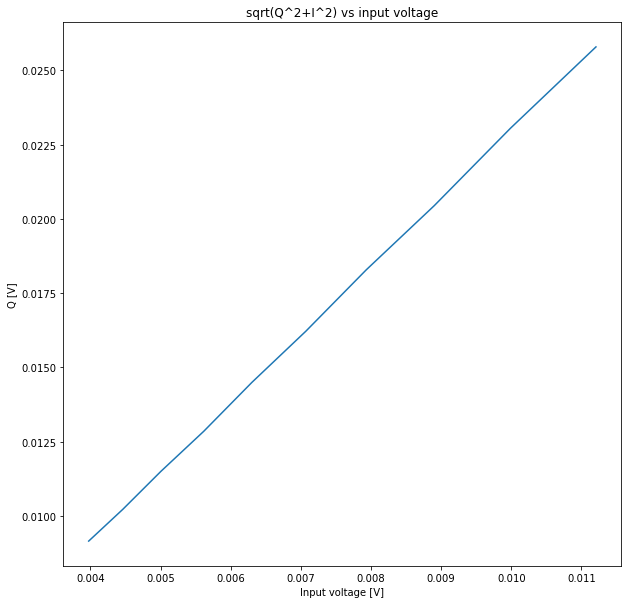

In [621]:
"""
Here, we plot the signal amplitude from the voltcheck function versus the initial voltage we put into the I port on the OPX.
It should be linear.
"""

fig, ax = plt.subplots(1,1, figsize=(10,10))

plt.plot(input_voltages, squared)


ax.set_title("sqrt(Q^2+I^2) vs input voltage")
ax.set_xlabel("Input voltage [V]")
ax.set_ylabel("Q [V]")

plt.show()

# changing RF gain sweep to make variables more understandable

In [ ]:
"""This is a function that is identical to """

def IQCheck(start, stop, step, LO = 3e9):
    u = unit()
    
    def toVolts(dBm, impedance = 50):
        impFactor = np.sqrt(impedance/1000)
        powerFactor = 10**(dBm/20)
        return impFactor*powerFactor
    
    phases = []
    print(f"LO Frequency at {LO}")
    qm.octave.set_lo_frequency(elements[0], LO)
    vals = {
        "input 1": {"signal amplitude" : [], "initial voltage": [], "freqs" : [], "phase" : [], "offset": [], "covariances": []},
        "input 2": {"signal amplitude" : [], "initial voltage": [], "freqs" : [], "phase" : [], "offset": [], "covariances": []}   
           }
    input_voltages = []
    Is = []
    Qs = []
    
    for output_voltage_from_octave in range(start, stop, step):
        
        V = config['waveforms']['readout_wf']['sample']
        P = V**2/50/2
        P_dBm_from_OPX = 10*np.log10(1000*P)
        
        rf_gain_dB = output_voltage_from_octave - P_dBm_from_OPX #gain to get input voltage given -30 dB initial voltage = 0.01 V amplitude
        
        qm.octave.set_rf_output_gain(elements[0], rf_gain_dB) #changing gain of initial voltage to set RF1 output to input_voltage
                                                        
        input_voltages.append(toVolts(input_voltage_dB))
        
        job = qm.execute(demod)
        res = job.result_handles
        res.wait_for_all_values()
        
        I = res.get("I").fetch(0)
        Q = res.get("Q").fetch(0)
        
        print(f"at {toVolts(input_voltage_dB)} volts, I : {(I[0][0])}, Q: {(Q[0][0])}")
        
        
        Is.append(I[0][0])
        Qs.append(Q[0][0])
        
    return {"I" : np.array(Is),
            "Q" : np.array(Qs),
            "input voltages" : np.array(input_voltages)
            }

In [632]:
config['elements']['qe1']['operations']

{'cw': 'const', 'cw_wo_trig': 'const_wo_trig', 'readout': 'readout_pulse'}

-30.0